# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [1]:
## 获得视频教程
import os
os.environ['DISABLE_VIDEO'] = 'TRUE'
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

[2023-10-16 16:32:42 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [2]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

[2023-10-16 16:32:42 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

In [3]:
import os
import pandas as pd
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

# 设置任务Task前缀
task_type = 'Habitat_'
# 设置数据目录
# mydir = r'你自己数据的路径'
mydir = get_param_in_cwd('radio_dir') or okds.ct
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
group_info = get_param_in_cwd('dataset_column') or 'group'
labelf = r'split_info/label-CV-0.csv'
# 读取标签数据列名
labels = [get_param_in_cwd('task_column') or 'label']

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [4]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(mydir, images=f'images_re', masks=f'masks_habitat')
# diagnose_3d_image_mask_settings(images, masks, verbose=True, assume_masks=[0, 1, 2, 3])
print(f'获取到{len(images)}个样本。')

获取到244个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [5]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

[2023-10-16 16:32:43 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


In [6]:
import warnings
import pandas as pd
import numpy as np
from onekey_algo.custom.components.Radiology import ConventionalRadiomics
 
warnings.filterwarnings("ignore")

rad_data = None
habitats = [1, 2, 3]
for habitat in habitats:
    images, masks = get_image_mask_from_dir(mydir, images=f'images_re', masks=f'masks_habitat')
    if os.path.exists(f'features/rad_features_h{habitat}.csv'):
        rad_data_ = pd.read_csv(f'features/rad_features_h{habitat}.csv', header=0)
    else:
        param_file = './custom_settings/exampleCT.yaml'
        radiomics = ConventionalRadiomics(param_file, correctMask=True)
        radiomics.extract(images, masks, workers=52, labels=habitat)
        rad_data_ = radiomics.get_label_data_frame(label=habitat)
        rad_data_.columns = [f"{c.replace('-', '_')}_h{habitat}" if c != 'ID' else 'ID' for c in rad_data_.columns]
        rad_data_.to_csv(f'features/rad_features_h{habitat}.csv', header=True, index=False)
    if rad_data is None:
        rad_data = rad_data_
    else:
        rad_data = pd.merge(rad_data, rad_data_, on='ID', how='inner')
rad_data

,ID,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,...,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_h3,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h3,wavelet_LLL_glszm_ZoneEntropy_h3,wavelet_LLL_glszm_ZonePercentage_h3,wavelet_LLL_glszm_ZoneVariance_h3,wavelet_LLL_ngtdm_Busyness_h3,wavelet_LLL_ngtdm_Coarseness_h3,wavelet_LLL_ngtdm_Complexity_h3,wavelet_LLL_ngtdm_Contrast_h3,wavelet_LLL_ngtdm_Strength_h3
0,1.nii.gz,1.612,30.433,3.117e+06,2.839,13.793,46.746,308.865,14.330,12.328,...,294307.435,3.412e-04,9.507,0.940,0.440,7.287e-04,0.005,1.178e+07,5.222,7715.588
1,10.nii.gz,1.153,81.350,1.064e+08,3.579,25.839,70.094,2002.137,40.368,50.018,...,81748.100,2.744e-03,8.282,0.942,0.072,5.728e-04,0.021,9.581e+05,5.526,4156.434
2,100.nii.gz,1.118,57.572,6.930e+07,3.387,18.370,83.012,1668.995,29.721,34.458,...,285049.598,2.014e-03,7.910,0.969,0.031,5.218e-04,0.023,2.143e+06,53.931,20838.569
3,101.nii.gz,2.524,24.312,7.706e+05,2.470,8.588,32.906,192.640,10.929,8.338,...,194506.408,2.579e-03,8.019,0.990,0.010,4.044e-04,0.026,1.581e+06,22.007,6175.005
4,102.nii.gz,2.191,96.682,1.648e+09,3.893,25.978,101.127,3803.736,63.408,85.273,...,425595.060,4.904e-03,7.422,0.990,0.010,4.400e-04,0.034,1.397e+06,120.073,11453.508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,95.nii.gz,4.185,151.928,2.131e+08,4.620,57.990,37.624,1893.737,64.139,65.989,...,458594.765,4.707e-04,8.771,0.969,0.031,1.318e-04,0.035,3.524e+06,21.083,26813.899
238,96.nii.gz,4.333,307.851,8.675e+08,5.449,166.967,40.208,3479.330,127.427,126.805,...,444951.962,2.313e-04,9.479,0.955,0.052,2.666e-04,0.006,9.740e+06,3.451,10392.656
239,97.nii.gz,0.400,17.687,3.046e+08,1.848,5.710,325.785,3537.242,18.691,27.445,...,33872.666,3.975e-04,8.513,0.798,99.182,4.940e-03,0.004,1.318e+06,0.866,1503.476
240,98.nii.gz,5.404,194.081,1.547e+09,5.023,66.798,95.334,3379.832,89.790,93.078,...,205264.106,2.697e-03,8.574,0.970,0.033,4.024e-04,0.023,2.856e+06,16.041,16521.733


## 特征统计

,0,count
1,firstorder,918
0,glcm,1122
4,gldm,714
2,glrlm,816
3,glszm,816
5,ngtdm,255
6,shape,42


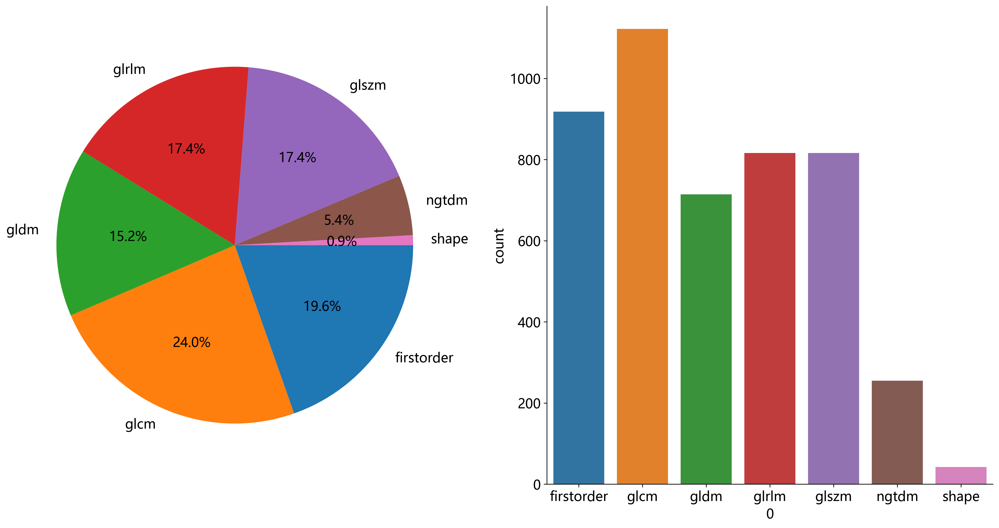

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
sorted_counts = pd.DataFrame([c.split('_')[-3] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
display(sorted_counts)

plt.figure(figsize=(20, 10))
ax = plt.subplot(121)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts[0]], startangle=0,
        counterclock = False, autopct = '%.1f%%')
# plt.bar_label(bar.containers[0])
ax = plt.subplot(122)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
bar = sns.barplot(data=sorted_counts, x=0, y='count', )
plt.savefig(f'img/{task_type}Rad_feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [8]:
group_info = 'group'
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID'].map(lambda x: f"{x}.nii.gz" if not (f"{x}".endswith('.nii.gz') or  f"{x}".endswith('.nii')) else x)
label_data = label_data[['ID', group_info] + labels]
label_data

,ID,group,label
0,1.nii.gz,train,0
1,2.nii.gz,train,1
2,3.nii.gz,train,1
3,5.nii.gz,train,1
4,6.nii.gz,train,1
...,...,...,...
237,227.nii.gz,test,1
238,232.nii.gz,test,1
239,233.nii.gz,test,1
240,239.nii.gz,test,1


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [9]:
# 删掉ID这一列。
from onekey_algo.custom.utils import print_join_info
print_join_info(rad_data, label_data)
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
# combined_data[['ID'] + selected_features[0]].to_csv('features/sel_habitat.csv', index=False)
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
display(combined_data[labels].value_counts())
display(combined_data[group_info].value_counts())
combined_data

[2023-10-16 16:32:43 - __init__.py:  55]	INFO	ID特征完全匹配！


label
1        193
0         49
dtype: int64

train    193
test      49
Name: group, dtype: int64

,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,...,wavelet_LLL_glszm_ZoneEntropy_h3,wavelet_LLL_glszm_ZonePercentage_h3,wavelet_LLL_glszm_ZoneVariance_h3,wavelet_LLL_ngtdm_Busyness_h3,wavelet_LLL_ngtdm_Coarseness_h3,wavelet_LLL_ngtdm_Complexity_h3,wavelet_LLL_ngtdm_Contrast_h3,wavelet_LLL_ngtdm_Strength_h3,group,label
0,1.612,30.433,3.117e+06,2.839,13.793,46.746,308.865,14.330,12.328,7.767,...,9.507,0.940,0.440,7.287e-04,0.005,1.178e+07,5.222,7715.588,train,0
1,1.153,81.350,1.064e+08,3.579,25.839,70.094,2002.137,40.368,50.018,9.068,...,8.282,0.942,0.072,5.728e-04,0.021,9.581e+05,5.526,4156.434,train,1
2,1.118,57.572,6.930e+07,3.387,18.370,83.012,1668.995,29.721,34.458,8.708,...,7.910,0.969,0.031,5.218e-04,0.023,2.143e+06,53.931,20838.569,test,1
3,2.524,24.312,7.706e+05,2.470,8.588,32.906,192.640,10.929,8.338,6.444,...,8.019,0.990,0.010,4.044e-04,0.026,1.581e+06,22.007,6175.005,train,1
4,2.191,96.682,1.648e+09,3.893,25.978,101.127,3803.736,63.408,85.273,10.924,...,7.422,0.990,0.010,4.400e-04,0.034,1.397e+06,120.073,11453.508,train,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,4.185,151.928,2.131e+08,4.620,57.990,37.624,1893.737,64.139,65.989,24.160,...,8.771,0.969,0.031,1.318e-04,0.035,3.524e+06,21.083,26813.899,train,1
238,4.333,307.851,8.675e+08,5.449,166.967,40.208,3479.330,127.427,126.805,52.961,...,9.479,0.955,0.052,2.666e-04,0.006,9.740e+06,3.451,10392.656,train,1
239,0.400,17.687,3.046e+08,1.848,5.710,325.785,3537.242,18.691,27.445,2.401,...,8.513,0.798,99.182,4.940e-03,0.004,1.318e+06,0.866,1503.476,train,1
240,5.404,194.081,1.547e+09,5.023,66.798,95.334,3379.832,89.790,93.078,33.643,...,8.574,0.970,0.033,4.024e-04,0.023,2.856e+06,16.041,16521.733,train,0


## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [10]:
combined_data.describe()

,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h3,wavelet_LLL_glszm_ZoneEntropy_h3,wavelet_LLL_glszm_ZonePercentage_h3,wavelet_LLL_glszm_ZoneVariance_h3,wavelet_LLL_ngtdm_Busyness_h3,wavelet_LLL_ngtdm_Coarseness_h3,wavelet_LLL_ngtdm_Complexity_h3,wavelet_LLL_ngtdm_Contrast_h3,wavelet_LLL_ngtdm_Strength_h3,label
count,242.000,242.000,2.420e+02,242.000,242.000,242.000,242.000,242.000,242.000,242.000,...,2.420e+02,242.000,242.000,242.000,2.420e+02,2.420e+02,2.420e+02,242.000,242.000,242.000
mean,1.645,99.665,2.518e+08,3.395,35.921,239.597,2171.332,45.049,51.597,13.440,...,2.070e-02,7.409,0.899,208.341,1.328e-02,1.653e+04,1.915e+06,1963.521,11334.908,0.798
std,1.622,97.518,4.579e+08,1.102,42.352,398.289,1275.985,38.935,46.251,15.226,...,7.322e-02,1.767,0.130,1626.096,5.866e-02,1.278e+05,2.466e+06,14192.657,17000.323,0.403
min,0.087,4.116,1.086e+05,0.577,1.591,7.222,80.258,2.847,3.036,0.442,...,2.115e-04,1.000,0.171,0.000,0.000e+00,5.372e-04,0.000e+00,0.000,0.000,0.000
25%,0.702,30.735,1.398e+07,2.594,10.859,56.571,1080.591,15.962,17.549,4.623,...,8.985e-04,6.832,0.888,0.030,4.204e-04,7.479e-03,2.635e+05,3.477,1895.569,1.000
50%,1.124,70.929,7.927e+07,3.473,23.668,99.198,2175.303,33.738,36.640,8.174,...,2.142e-03,7.930,0.948,0.062,1.178e-03,1.851e-02,1.128e+06,8.804,5910.314,1.000
75%,2.040,132.889,3.090e+08,4.195,44.192,231.712,3100.965,61.923,66.218,16.065,...,6.503e-03,8.613,0.972,0.231,4.426e-03,3.460e-02,2.823e+06,50.074,12277.233,1.000
max,15.092,607.022,3.553e+09,6.043,283.903,3769.910,5354.723,242.073,260.262,111.293,...,5.001e-01,9.968,1.000,17883.695,5.422e-01,1.000e+06,1.818e+07,182444.000,134186.495,1.000


## 正则化

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [11]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info)
data = data.dropna(axis=1)
data.describe()

,exponential_firstorder_10Percentile_h1,exponential_firstorder_90Percentile_h1,exponential_firstorder_Energy_h1,exponential_firstorder_Entropy_h1,exponential_firstorder_InterquartileRange_h1,exponential_firstorder_Kurtosis_h1,exponential_firstorder_Maximum_h1,exponential_firstorder_Mean_h1,exponential_firstorder_MeanAbsoluteDeviation_h1,exponential_firstorder_Median_h1,...,wavelet_LLL_glszm_SmallAreaLowGrayLevelEmphasis_h3,wavelet_LLL_glszm_ZoneEntropy_h3,wavelet_LLL_glszm_ZonePercentage_h3,wavelet_LLL_glszm_ZoneVariance_h3,wavelet_LLL_ngtdm_Busyness_h3,wavelet_LLL_ngtdm_Coarseness_h3,wavelet_LLL_ngtdm_Complexity_h3,wavelet_LLL_ngtdm_Contrast_h3,wavelet_LLL_ngtdm_Strength_h3,label
count,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,...,242.000,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,2.420e+02,242.000
mean,-2.936e-17,-8.808e-17,-9.542e-17,-2.643e-16,-1.211e-16,-6.239e-17,1.688e-16,-2.422e-16,-8.441e-17,-5.138e-17,...,0.000,1.688e-16,-6.826e-16,-2.202e-17,5.505e-18,-2.202e-17,-6.973e-17,-3.854e-17,2.936e-17,0.798
std,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,...,0.998,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,9.979e-01,0.403
min,-9.398e-01,-9.739e-01,-5.719e-01,-2.571e+00,-9.532e-01,-7.285e-01,-1.619e+00,-1.095e+00,-1.054e+00,-9.370e-01,...,-0.297,-3.725e+00,-5.416e+00,-2.232e-01,-2.346e-01,-1.429e-01,-8.948e-01,-1.885e-01,-7.537e-01,0.000
25%,-5.618e-01,-7.038e-01,-5.356e-01,-7.276e-01,-5.841e-01,-5.204e-01,-8.780e-01,-7.596e-01,-7.335e-01,-5.670e-01,...,-0.272,-3.122e-01,-6.450e-02,-1.325e-01,-2.235e-01,-1.253e-01,-6.502e-01,-1.265e-01,-5.546e-01,1.000
50%,-3.360e-01,-2.930e-01,-3.865e-01,5.407e-02,-3.006e-01,-3.894e-01,9.040e-03,-2.716e-01,-3.186e-01,-3.370e-01,...,-0.254,3.032e-01,3.470e-01,-1.324e-01,-2.020e-01,-1.253e-01,-2.894e-01,-1.261e-01,-3.125e-01,1.000
75%,2.388e-01,3.648e-01,9.732e-02,7.187e-01,1.947e-01,2.017e-02,7.701e-01,4.488e-01,3.213e-01,1.827e-01,...,-0.184,6.456e-01,5.609e-01,-1.324e-01,-1.524e-01,-1.253e-01,3.425e-01,-1.246e-01,3.068e-02,1.000
max,8.461e+00,5.357e+00,8.436e+00,2.484e+00,5.692e+00,6.272e+00,2.308e+00,5.053e+00,4.477e+00,6.391e+00,...,7.306,1.322e+00,7.817e-01,9.744e+00,9.610e+00,7.938e+00,6.962e+00,1.248e+01,7.242e+00,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [12]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

sub_data = data[data[group_info] == 'train']
stats = clinic_stats(sub_data, stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]))
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,exponential_firstorder_10Percentile_h1,-0.00±1.00,0.09±0.78,-0.02±1.05,0.082
1,exponential_firstorder_90Percentile_h1,-0.00±1.00,-0.02±0.82,0.00±1.04,0.851
2,exponential_firstorder_Energy_h1,-0.00±1.00,0.22±1.22,-0.06±0.93,0.641
3,exponential_firstorder_Entropy_h1,-0.00±1.00,0.05±1.06,-0.01±0.99,0.711
4,exponential_firstorder_InterquartileRange_h1,-0.00±1.00,-0.03±0.68,0.01±1.07,0.716
...,...,...,...,...,...
4004,wavelet_LLL_ngtdm_Busyness_h3,0.00±1.00,-0.14±0.27,0.03±1.11,0.332
4005,wavelet_LLL_ngtdm_Coarseness_h3,0.00±1.00,-0.13±0.00,0.03±1.12,0.15
4006,wavelet_LLL_ngtdm_Complexity_h3,-0.00±1.00,0.15±1.13,-0.04±0.97,0.516
4007,wavelet_LLL_ngtdm_Contrast_h3,-0.00±1.00,0.24±2.02,-0.06±0.48,0.033


#### 输出特征分布的图

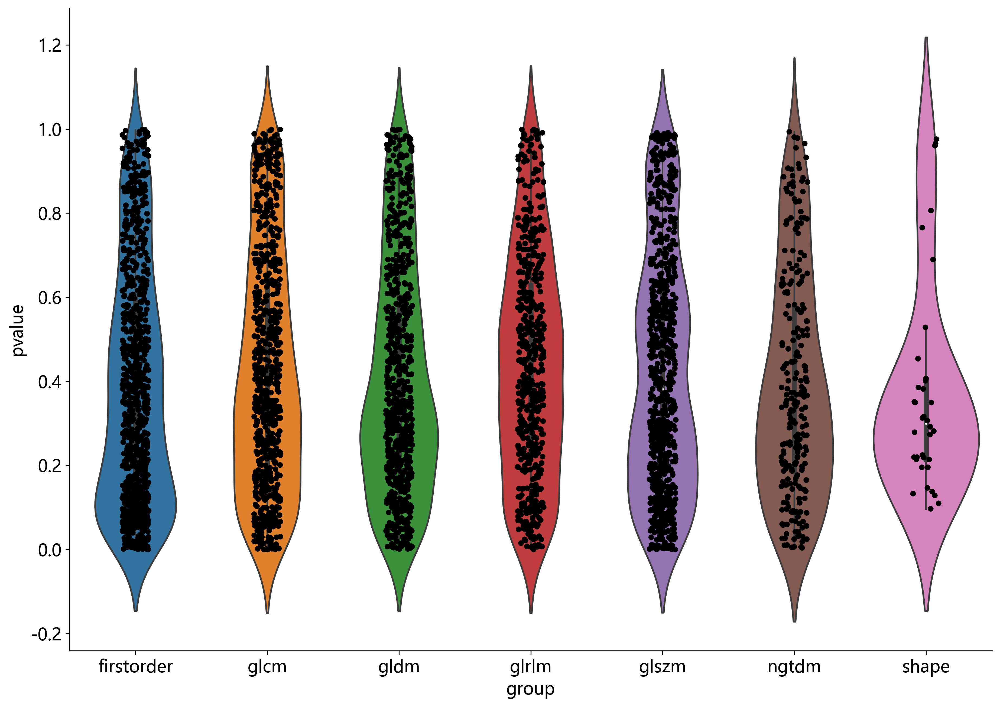

In [13]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-3])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/{task_type}Rad_feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [14]:
pvalue = 0.05
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
sub_data = sub_data[sel_feature]
sub_data

,exponential_glcm_Imc1_h1,lbp_3D_m1_firstorder_InterquartileRange_h1,lbp_3D_m1_firstorder_RobustMeanAbsoluteDeviation_h1,lbp_3D_m2_firstorder_InterquartileRange_h1,lbp_3D_m2_firstorder_Median_h1,lbp_3D_m2_firstorder_RobustMeanAbsoluteDeviation_h1,lbp_3D_m2_firstorder_Skewness_h1,lbp_3D_m2_glszm_SizeZoneNonUniformityNormalized_h1,lbp_3D_m2_glszm_SmallAreaEmphasis_h1,logarithm_firstorder_Mean_h1,...,wavelet_LLL_firstorder_MeanAbsoluteDeviation_h3,wavelet_LLL_firstorder_Variance_h3,wavelet_LLL_gldm_GrayLevelVariance_h3,wavelet_LLL_glszm_GrayLevelVariance_h3,wavelet_LLL_glszm_HighGrayLevelZoneEmphasis_h3,wavelet_LLL_glszm_SmallAreaHighGrayLevelEmphasis_h3,wavelet_LLL_ngtdm_Contrast_h3,wavelet_LLL_ngtdm_Strength_h3,label,group
0,0.516,-0.443,-0.770,-0.484,-0.314,-0.775,0.963,-0.673,-0.532,1.734,...,1.211,1.245,1.245,1.223,0.357,0.355,-0.126,-0.190,0,train
1,-0.712,-0.330,-0.647,-0.368,-0.084,-0.620,0.051,0.369,0.514,0.174,...,-0.191,-0.449,-0.449,-0.482,-0.461,-0.467,-0.126,-0.399,1,train
3,-1.645,-0.330,-0.663,-0.318,-0.314,-0.634,1.862,-1.516,-1.978,0.833,...,0.075,-0.234,-0.234,-0.265,-0.039,-0.031,-0.125,-0.281,1,train
4,0.332,-0.443,-0.744,-0.419,-0.314,-0.737,1.053,-0.419,-0.257,0.716,...,0.673,0.229,0.230,0.182,0.850,0.863,-0.118,0.029,0,train
5,0.285,-0.217,-0.643,-0.278,-0.084,-0.614,1.286,0.152,0.371,0.941,...,2.209,2.225,2.225,2.136,7.008,7.059,-0.111,1.904,1,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,-0.194,-0.443,-0.674,-0.403,-0.128,-0.675,1.588,-1.261,-1.350,0.186,...,1.505,1.283,1.283,1.226,0.975,0.990,-0.125,0.932,1,train
238,-0.654,-0.443,-0.680,-0.403,-0.100,-0.658,1.676,-1.259,-1.328,1.039,...,0.728,0.829,0.829,0.793,0.957,0.938,-0.126,-0.033,1,train
239,1.508,3.070,1.939,3.071,-0.064,1.985,-1.248,-0.740,-0.503,-1.171,...,-0.732,-0.650,-0.650,-0.667,-0.651,-0.652,-0.127,-0.555,1,train
240,0.617,-0.443,-0.776,-0.419,-0.084,-0.749,2.161,0.295,0.516,0.527,...,0.615,0.535,0.536,0.514,-0.001,0.011,-0.125,0.327,0,train


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [15]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

[2023-10-16 16:33:15 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


In [16]:
pearson_corr = sub_data[[c for c in sub_data.columns if c not in labels]].corr('pearson')
# kendall_corr = data[[c for c in data.columns if c not in labels]].corr('kendall')
# spearman_corr = data[[c for c in data.columns if c not in labels]].corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [17]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix

if data.shape[1] < 100:
    plt.figure(figsize=(50.0, 40.0))

    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/{task_type}Rad_feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

if data.shape[1] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/{task_type}Rad_feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [19]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

[2023-10-16 16:33:15 - Manager.py: 118]	INFO	播放视频功能已经设置成：Disable！


In [20]:
import math
from onekey_algo.custom.components.comp1 import select_feature, select_feature_mrmr

sel_feature = select_feature(pearson_corr, threshold=0.9, topn=512, verbose=False)
sel_feature = select_feature_mrmr(sub_data[sel_feature + labels], num_features=32)
sel_feature += labels + [group_info]
sel_feature

['logarithm_glcm_ClusterShade_h2',
 'original_ngtdm_Contrast_h3',
 'logarithm_ngtdm_Complexity_h3',
 'lbp_3D_m2_firstorder_Kurtosis_h3',
 'wavelet_HLL_glcm_ClusterShade_h2',
 'squareroot_ngtdm_Strength_h3',
 'lbp_3D_m1_glszm_GrayLevelNonUniformityNormalized_h2',
 'lbp_3D_m2_firstorder_InterquartileRange_h1',
 'gradient_glszm_LargeAreaLowGrayLevelEmphasis_h2',
 'wavelet_LHL_firstorder_Median_h3',
 'wavelet_LLL_glszm_ZoneVariance_h2',
 'wavelet_LHL_firstorder_Median_h2',
 'logarithm_firstorder_Kurtosis_h3',
 'square_ngtdm_Strength_h3',
 'lbp_3D_m2_firstorder_Median_h1',
 'logarithm_glszm_LargeAreaHighGrayLevelEmphasis_h3',
 'wavelet_LLL_ngtdm_Contrast_h3',
 'wavelet_LHH_ngtdm_Contrast_h2',
 'wavelet_HHH_ngtdm_Contrast_h3',
 'wavelet_HLL_firstorder_Skewness_h2',
 'lbp_3D_m1_glrlm_GrayLevelVariance_h2',
 'logarithm_glszm_GrayLevelVariance_h3',
 'lbp_3D_m1_firstorder_10Percentile_h2',
 'wavelet_LLL_ngtdm_Strength_h3',
 'lbp_3D_m2_ngtdm_Contrast_h3',
 'wavelet_LHL_firstorder_Mean_h3',
 'squa

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [21]:
sel_data = data[sel_feature]
sel_data

,logarithm_glcm_ClusterShade_h2,original_ngtdm_Contrast_h3,logarithm_ngtdm_Complexity_h3,lbp_3D_m2_firstorder_Kurtosis_h3,wavelet_HLL_glcm_ClusterShade_h2,squareroot_ngtdm_Strength_h3,lbp_3D_m1_glszm_GrayLevelNonUniformityNormalized_h2,lbp_3D_m2_firstorder_InterquartileRange_h1,gradient_glszm_LargeAreaLowGrayLevelEmphasis_h2,wavelet_LHL_firstorder_Median_h3,...,lbp_3D_m2_ngtdm_Contrast_h3,wavelet_LHL_firstorder_Mean_h3,squareroot_firstorder_Kurtosis_h3,lbp_3D_m2_glszm_ZoneEntropy_h2,gradient_gldm_GrayLevelVariance_h3,lbp_3D_m2_firstorder_RobustMeanAbsoluteDeviation_h1,wavelet_LHH_gldm_GrayLevelVariance_h3,wavelet_LHH_glrlm_LowGrayLevelRunEmphasis_h2,label,group
2,-0.348,-0.194,-0.078,-5.713e-01,-0.231,0.313,-0.458,-0.206,-0.181,0.352,...,0.278,0.325,-0.434,-0.043,-0.158,-0.381,0.270,0.532,1,test
10,0.532,-0.202,-0.941,-5.082e-01,-0.530,-0.362,1.731,-0.272,-0.423,0.871,...,-0.954,0.670,0.125,-1.620,2.002,-0.501,0.200,1.162,1,test
11,-0.424,-0.210,1.674,-5.752e-01,-0.264,-0.161,-0.530,-0.362,-0.267,0.699,...,0.552,0.613,-0.442,0.610,0.154,-0.543,0.209,0.372,1,test
14,-0.077,-0.219,-0.441,-6.467e-01,-0.242,-0.025,-0.536,-0.395,0.093,0.253,...,-0.522,0.221,-0.466,1.400,-0.634,-0.572,0.243,0.074,1,test
15,0.095,-0.224,-0.040,5.112e-01,-0.215,-0.133,-0.408,-0.272,0.127,0.224,...,-0.471,0.198,0.233,0.953,-0.915,-0.523,0.111,-0.184,1,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
237,0.102,-0.161,0.534,-5.202e-01,-0.014,-0.177,0.039,-0.403,-0.075,-0.147,...,-0.090,-0.003,-0.340,1.013,-0.247,-0.675,0.236,0.341,1,train
238,0.069,-0.174,0.327,3.912e-01,-0.058,-0.440,0.149,-0.403,-0.073,-0.114,...,-0.462,-0.175,-0.285,1.502,-0.128,-0.658,0.227,0.649,1,train
239,1.044,-0.186,-0.551,1.967e+00,0.376,-0.436,0.275,3.071,-0.072,-0.213,...,-0.461,-0.030,0.274,-0.022,-0.398,1.985,0.232,-0.744,1,train
240,-0.816,-0.169,1.796,-6.890e-01,-0.049,-0.217,0.940,-0.419,-0.074,0.014,...,0.595,-0.161,-0.348,1.486,-0.337,-0.749,0.217,-0.216,0,train


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

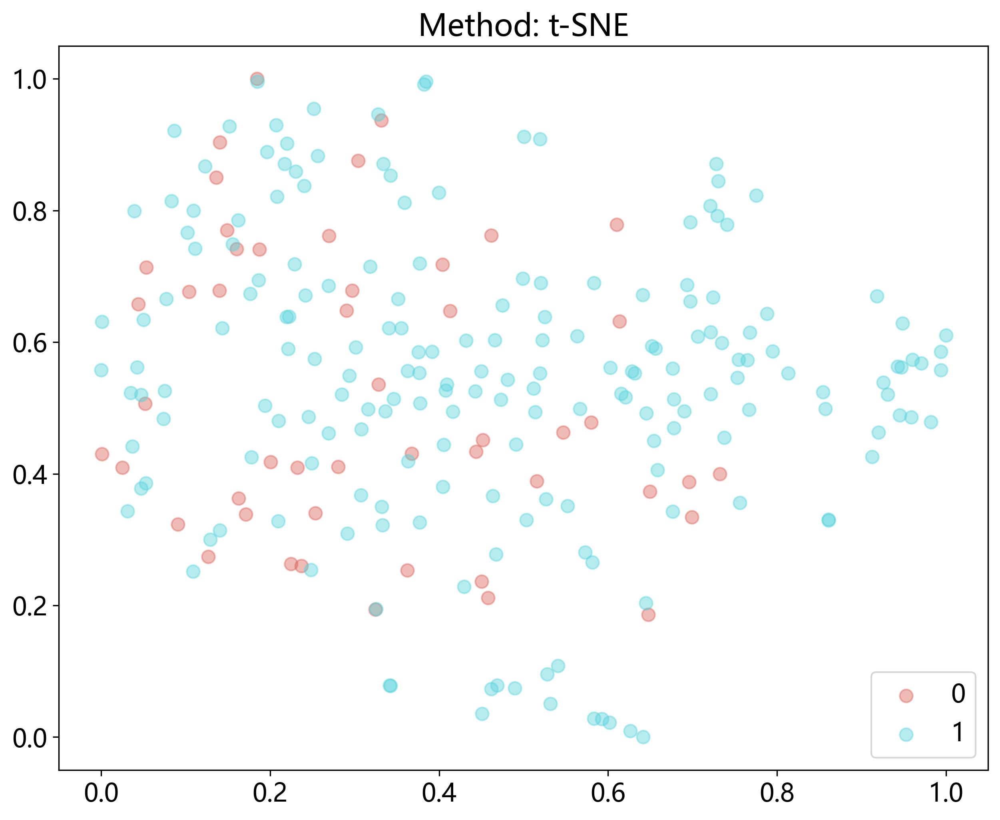

In [22]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(data[sel_feature[:-2]], data[labels[0]], methods='t-SNE')

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%

In [23]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

val_data = sel_data[sel_data[group_info] != 'val']
val_ids = ids[val_data.index]
val_data = val_data.reset_index()
val_data = val_data.drop('index', axis=1)
y_val_data = val_data[labels]
X_val_data = val_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] == 'test']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 验证集样本数：{X_val_data.shape}, 测试集样本数：{X_test_data.shape}")

训练集样本数：(193, 32), 验证集样本数：(242, 32), 测试集样本数：(49, 32)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

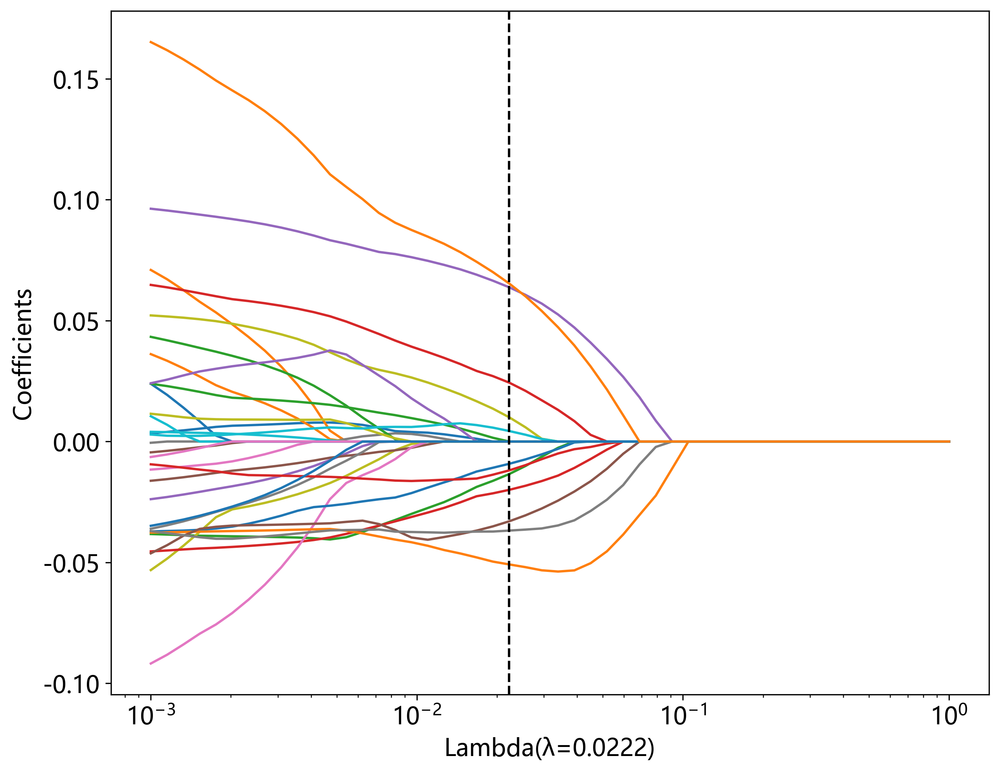

In [24]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None, cv=10)
plt.savefig(f'img/{task_type}Rad_feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

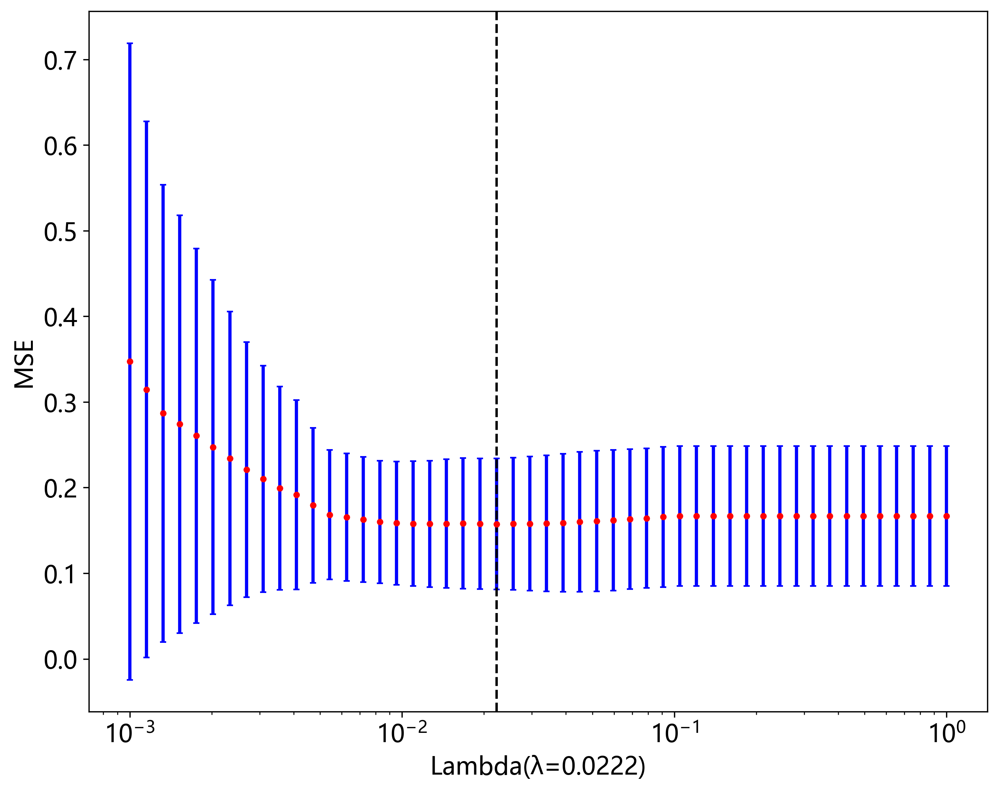

In [25]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50)
plt.savefig(f'img/{task_type}Rad_feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [26]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [27]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.7979274611398969  -0.013456 * logarithm_ngtdm_Complexity_h3 +0.024356 * lbp_3D_m2_firstorder_Kurtosis_h3 +0.063792 * wavelet_HLL_glcm_ClusterShade_h2 -0.019986 * square_ngtdm_Strength_h3 +0.010026 * wavelet_HHH_ngtdm_Contrast_h3 -0.009213 * lbp_3D_m1_glrlm_GrayLevelVariance_h2 -0.050837 * logarithm_glszm_GrayLevelVariance_h3 -0.011934 * wavelet_LLL_ngtdm_Strength_h3 -0.032998 * wavelet_LHL_firstorder_Mean_h3 -0.036834 * lbp_3D_m2_glszm_ZoneEntropy_h2 +0.004346 * lbp_3D_m2_firstorder_RobustMeanAbsoluteDeviation_h1 +0.065357 * wavelet_LHH_glrlm_LowGrayLevelRunEmphasis_h2


### 特征权重

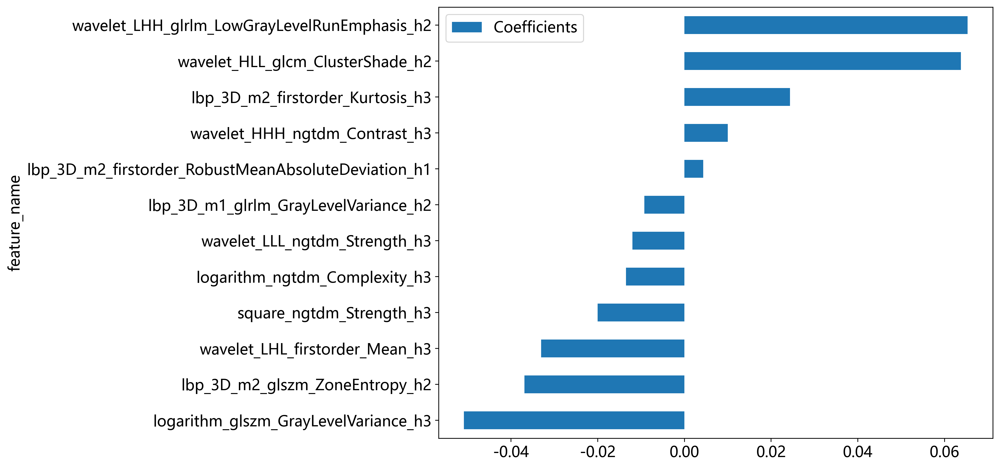

In [28]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/{task_type}Rad_feature_weights.svg', bbox_inches = 'tight')

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [29]:
X_data = X_data[selected_features[0]]
X_val_data = X_val_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['logarithm_ngtdm_Complexity_h3', 'lbp_3D_m2_firstorder_Kurtosis_h3',
       'wavelet_HLL_glcm_ClusterShade_h2', 'square_ngtdm_Strength_h3',
       'wavelet_HHH_ngtdm_Contrast_h3', 'lbp_3D_m1_glrlm_GrayLevelVariance_h2',
       'logarithm_glszm_GrayLevelVariance_h3', 'wavelet_LLL_ngtdm_Strength_h3',
       'wavelet_LHL_firstorder_Mean_h3', 'lbp_3D_m2_glszm_ZoneEntropy_h2',
       'lbp_3D_m2_firstorder_RobustMeanAbsoluteDeviation_h1',
       'wavelet_LHH_glrlm_LowGrayLevelRunEmphasis_h2'],
      dtype='object')

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [30]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model(model_names)
models['LR'] = LogisticRegression(penalty='none', max_iter=100)
models['RandomForest'] = RandomForestClassifier(n_estimators=40, max_depth=4, min_samples_split=2, random_state=0)
models['XGBoost'] = XGBClassifier(n_estimators=15, objective='binary:logistic', max_depth=2, min_child_weight=1.2,
                                  use_label_encoder=False, eval_metric='error')
models['LightGBM'] = LGBMClassifier(n_estimators=24,  max_depth=2, min_child_weight=0.5,)
models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=46, max_depth=4, min_samples_split=2, random_state=0)
    
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。


```python
def get_bst_split(X_data: pd.DataFrame, y_data: pd.DataFrame,
            models: dict, test_size=0.2, metric_fn=accuracy_score, n_trails=10,
            cv: bool = False, shuffle: bool = False, metric_cut_off: float = None, random_state=None):
    """
    寻找数据集中最好的数据划分。
    Args:
        X_data: 训练数据
        y_data: 监督数据
        models: 模型名称，Dict类型、
        test_size: 测试集比例，只有当cv=False时生效
        metric_fn: 评价模型好坏的函数，默认准确率，可选roc_auc_score。
        n_trails: 尝试多少次寻找最佳数据集划分。
        cv: 是否是交叉验证，默认是False，当为True时，n_trails为交叉验证的n_fold
        shuffle: 是否进行随机打乱
        metric_cut_off: 当metric_fn的值达到多少时进行截断。
        random_state: 随机种子

    Returns: {'max_idx': max_idx, "max_model": max_model, "max_metric": max_metric, "results": results}

    """
```

**注意：这里采用了【挑数据】，如果想要严谨，请修改`n_trails=1`。**

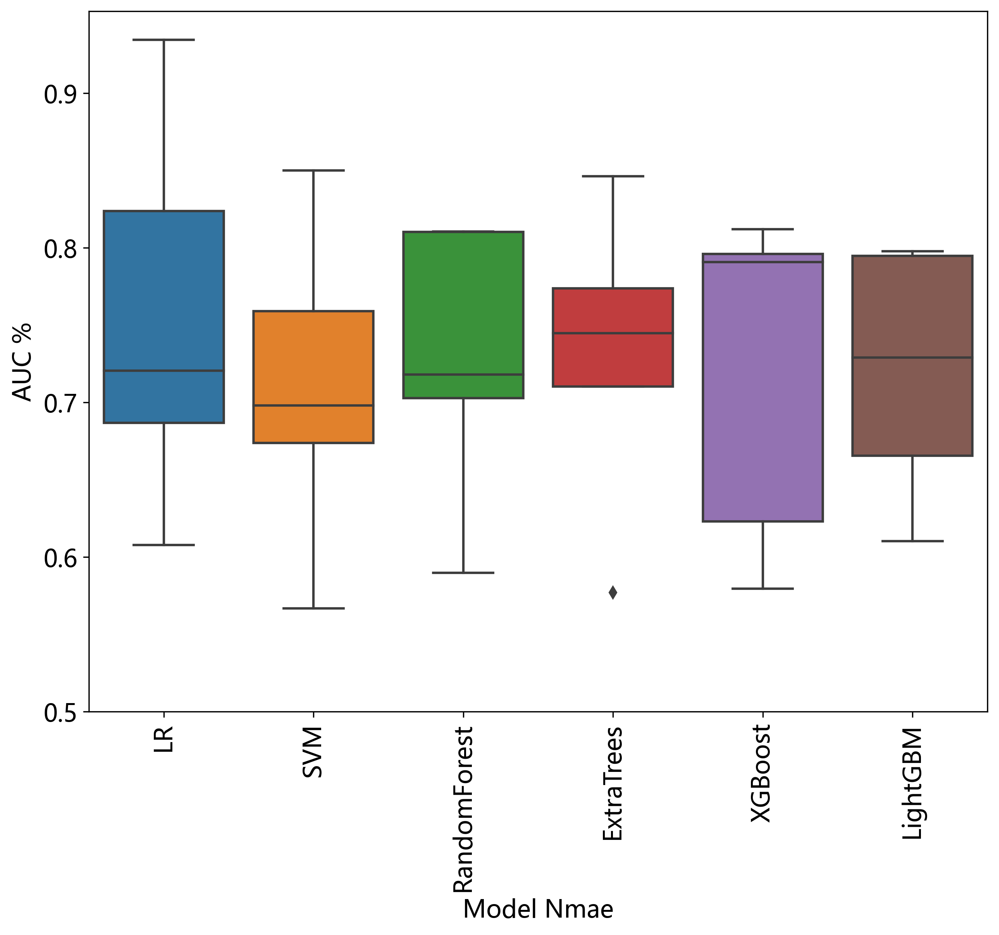

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_val_data, y_val_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=True, random_state=0)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
X_train_sel, X_val_sel, X_test_sel, y_train_sel, y_val_sel, y_test_sel = X_data, X_val_data, X_test_data, y_data, y_val_data, y_test_data
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Nmae')
plt.xticks(rotation=90)
plt.ylim(0.5,)
plt.savefig(f'img/{task_type}Rad_model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

In [32]:
import joblib
from onekey_algo.custom.components.comp1 import plot_feature_importance
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model(model_names)
    new_models['LR'] = LogisticRegression(penalty='none', max_iter=100)
    new_models['RandomForest'] = RandomForestClassifier(n_estimators=5, max_depth=3,
                                                        min_samples_split=2, random_state=0)
    new_models['XGBoost'] = XGBClassifier(n_estimators=17, objective='binary:logistic', max_depth=2, min_child_weight=1.2,
                                              use_label_encoder=False, eval_metric='error')
    new_models['LightGBM'] = LGBMClassifier(n_estimators=25,  max_depth=3, min_child_weight=0.5,)
    new_models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=500, max_depth=4, min_samples_split=2, random_state=0)
    new_models = list(new_models.values())
    for mn, m in zip(model_names, new_models):
        m.fit(X_train_sel, y_train_sel[l])
        # 保存训练的模型
#         joblib.dump(m, f'models/{task_type}Rad_{mn}_{l}.pkl') 
        # 输出模型特征重要性，只针对高级树模型有用
#         plot_feature_importance(m, selected_features[0], save_dir='img', prefix=f'{task_type}')
    targets.append(new_models)

In [33]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

metric = []
pred_sel_idx = []
predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel))  
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"Train"))

        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, 'Test'))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))

    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric[metric['Task'] != 'Val']

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.731,0.850,0.7876 - 0.9124,0.897,0.688,0.422,0.964,0.422,0.897,0.574,0.157,Train
1,LR,0.714,0.687,0.4827 - 0.8917,0.700,0.737,0.389,0.903,0.389,0.700,0.500,0.261,Test
2,SVM,0.896,0.942,0.8948 - 0.9887,0.923,0.890,0.679,0.979,0.679,0.923,0.783,0.194,Train
3,SVM,0.633,0.777,0.6442 - 0.9097,1.000,0.553,0.357,1.000,0.357,1.000,0.526,0.194,Test
4,RandomForest,0.824,0.858,0.7915 - 0.9249,0.821,0.825,0.542,0.948,0.542,0.821,0.653,0.254,Train
5,RandomForest,0.612,0.696,0.5249 - 0.8674,0.800,0.579,0.320,0.917,0.320,0.800,0.457,0.206,Test
6,ExtraTrees,0.891,0.947,0.9138 - 0.9800,0.821,0.909,0.696,0.952,0.696,0.821,0.753,0.249,Train
7,ExtraTrees,0.612,0.695,0.5288 - 0.8609,0.800,0.564,0.320,0.917,0.320,0.800,0.457,0.215,Test
8,XGBoost,0.938,0.971,0.9465 - 0.9953,0.897,0.948,0.814,0.973,0.814,0.897,0.854,0.320,Train
9,XGBoost,0.776,0.872,0.7675 - 0.9761,0.900,0.763,0.474,0.967,0.474,0.900,0.621,0.241,Test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

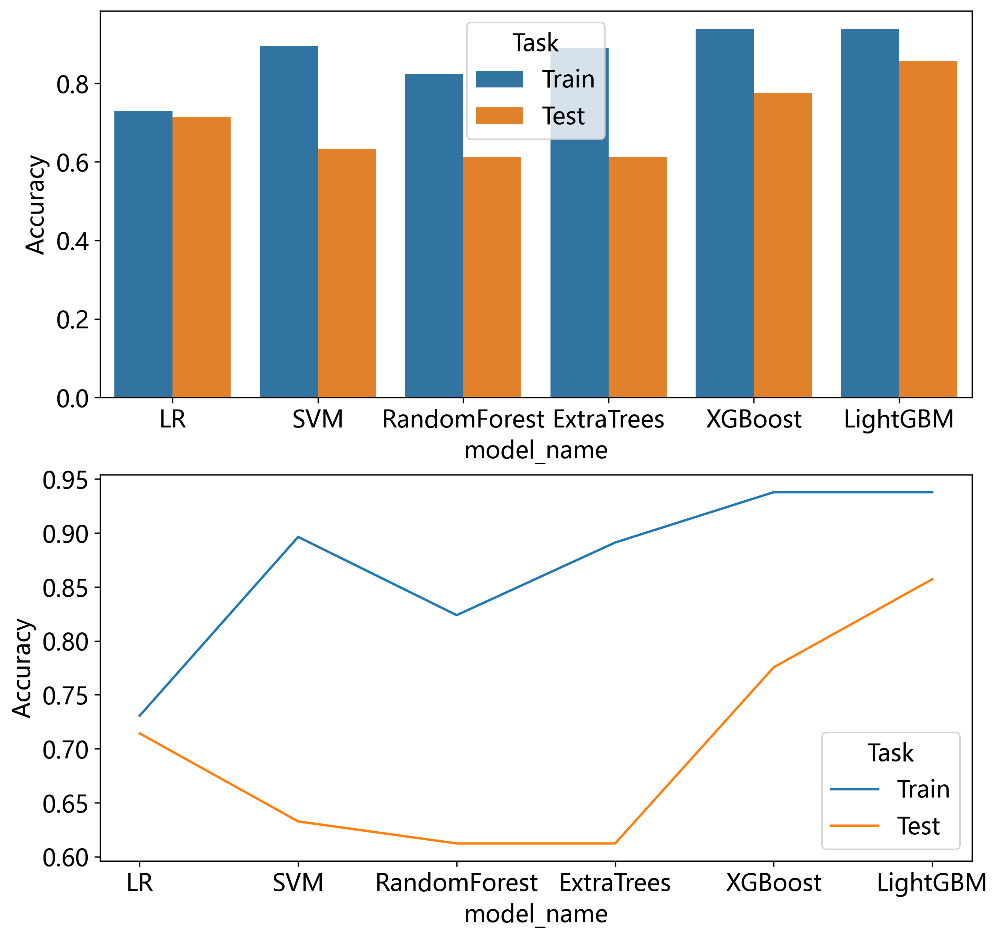

In [34]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/{task_type}Rad_model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

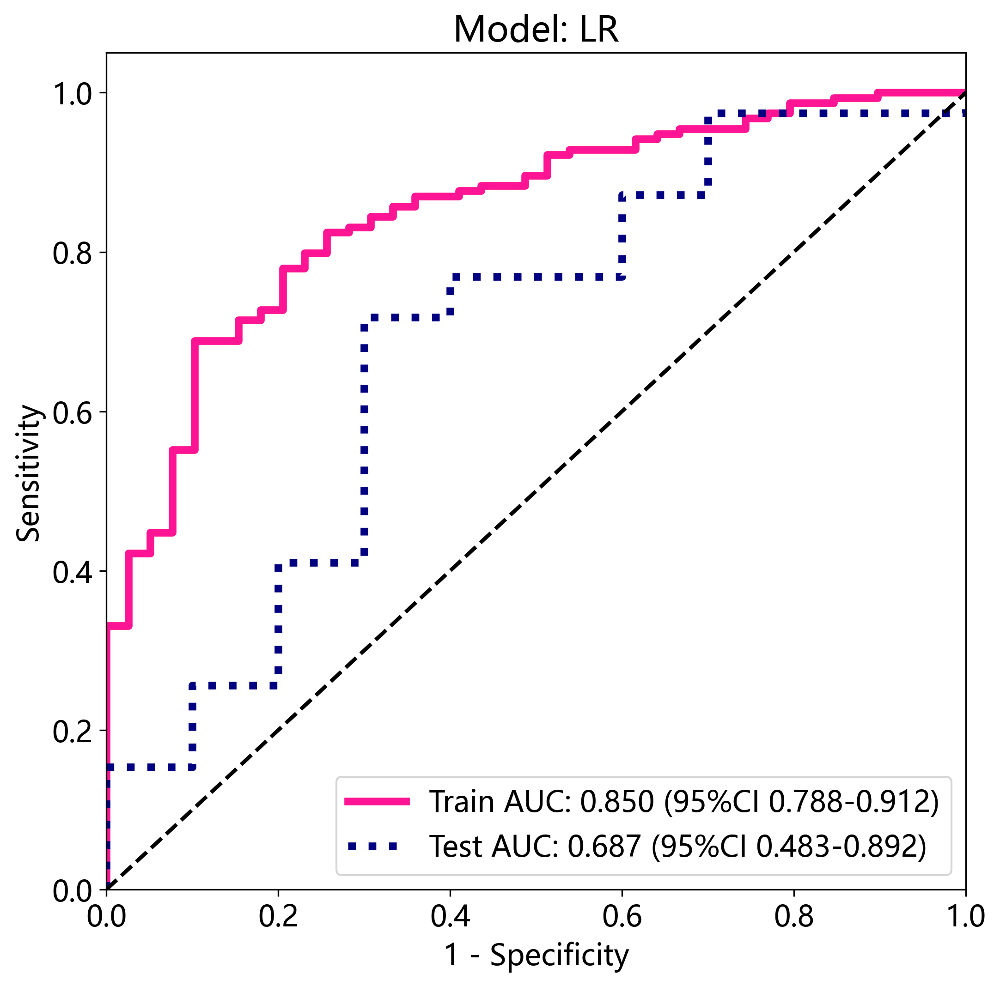

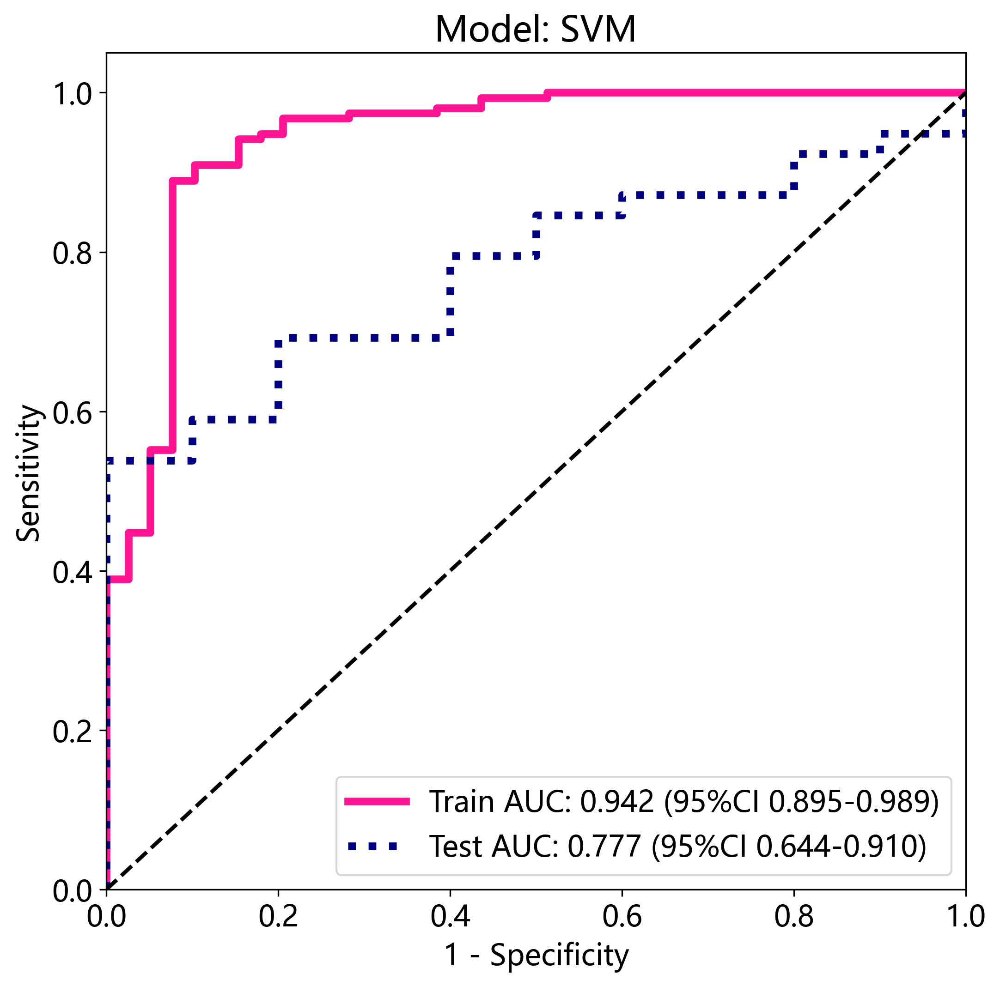

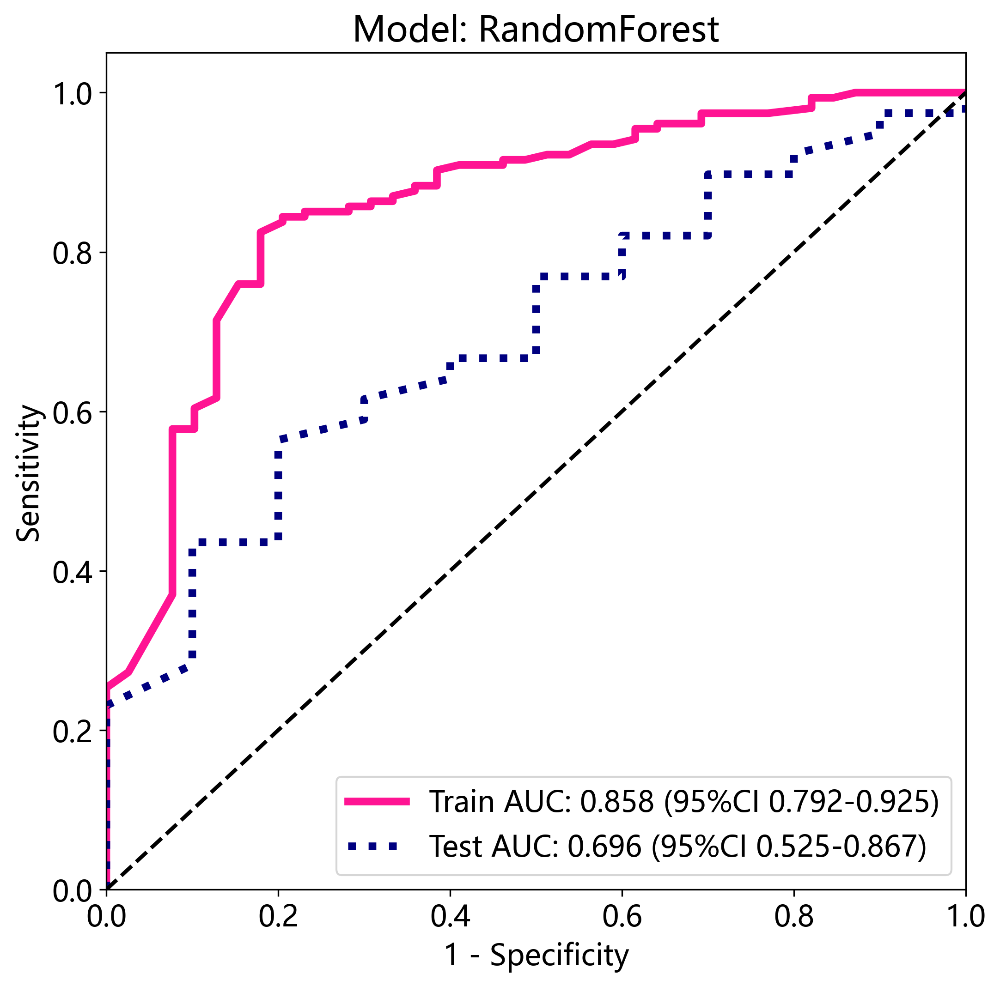

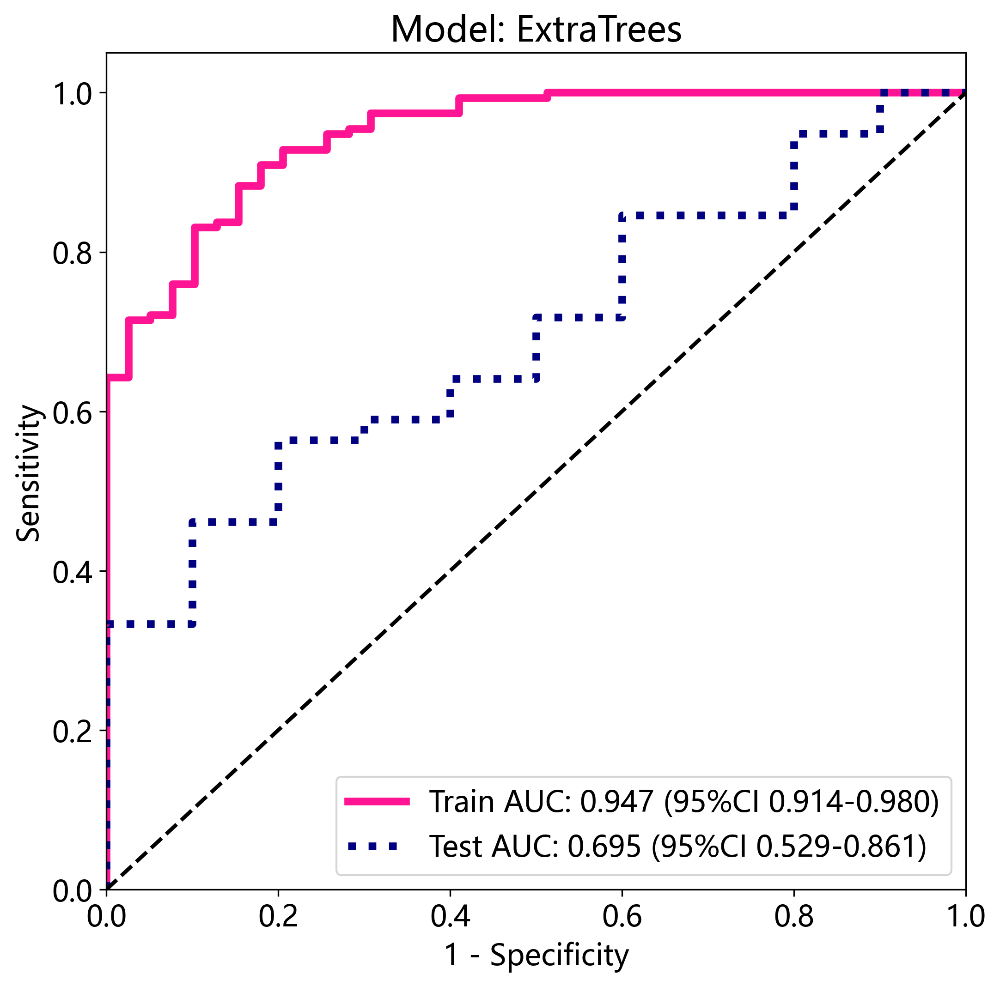

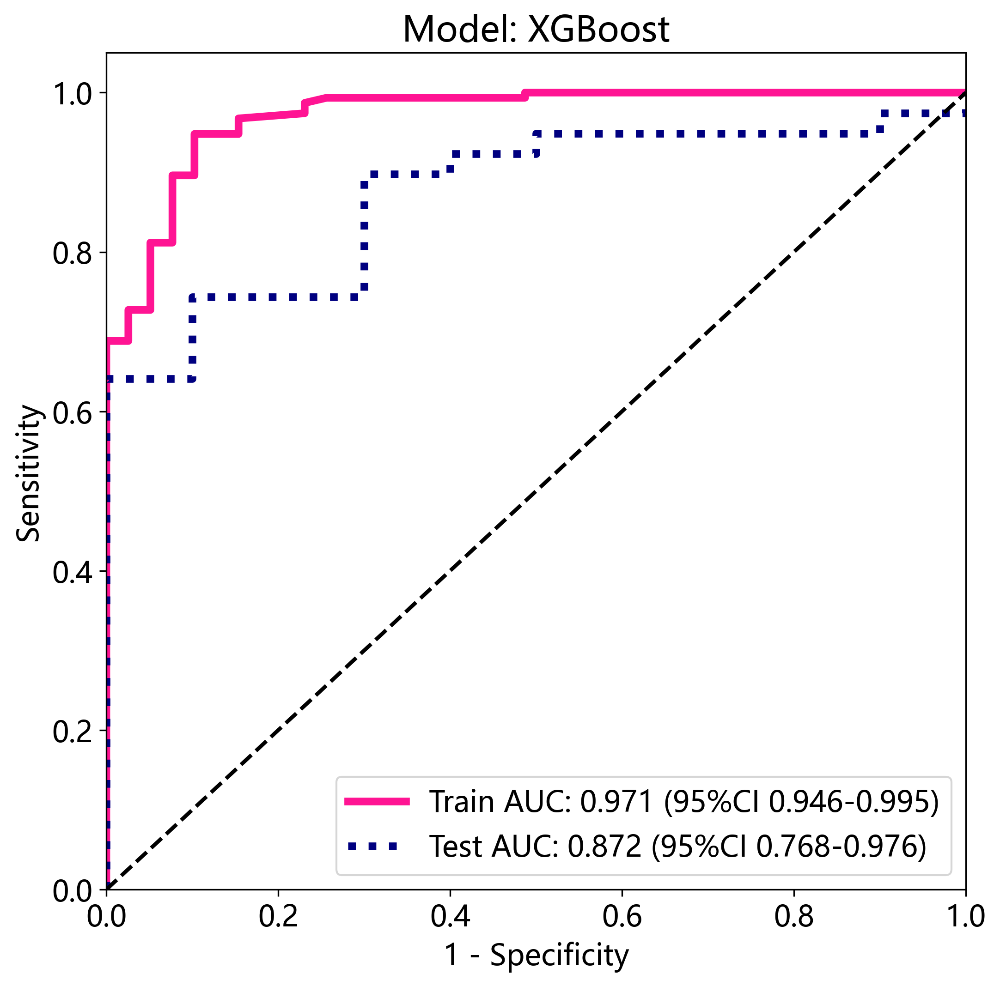

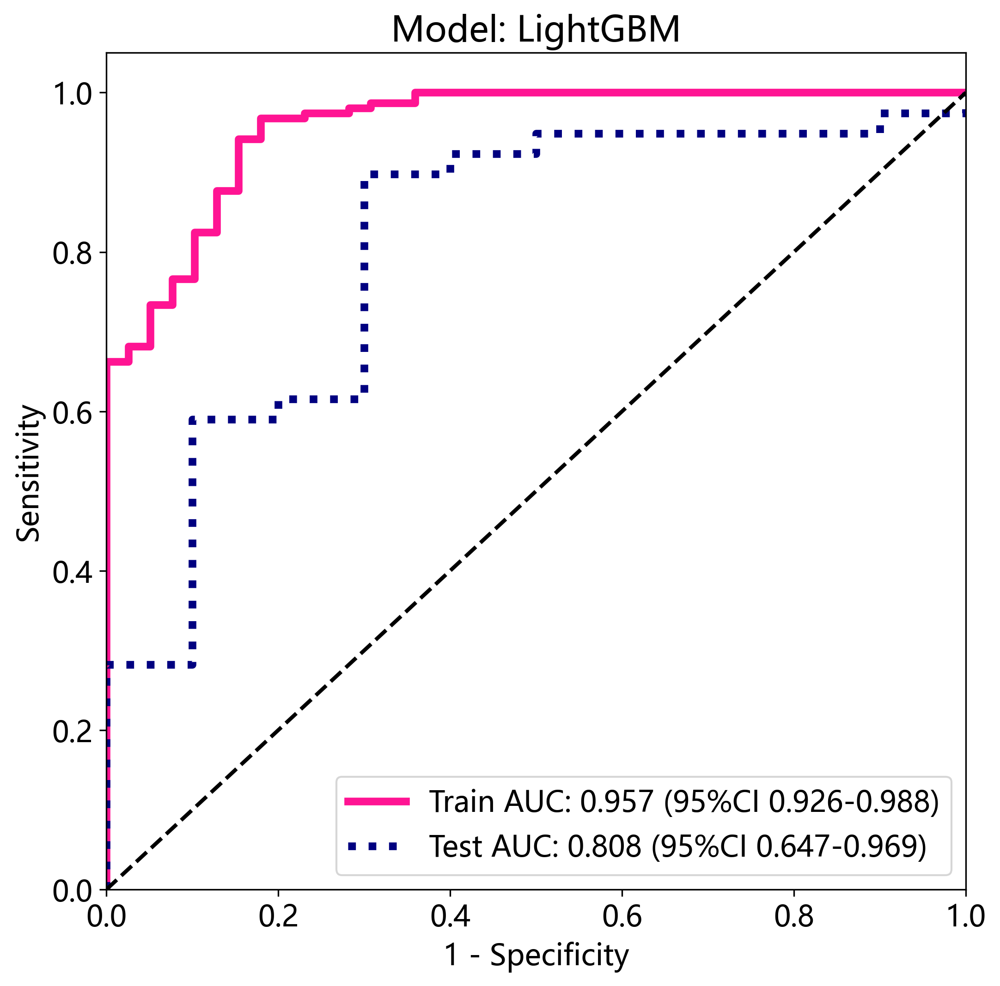

In [35]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/{task_type}Rad_model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

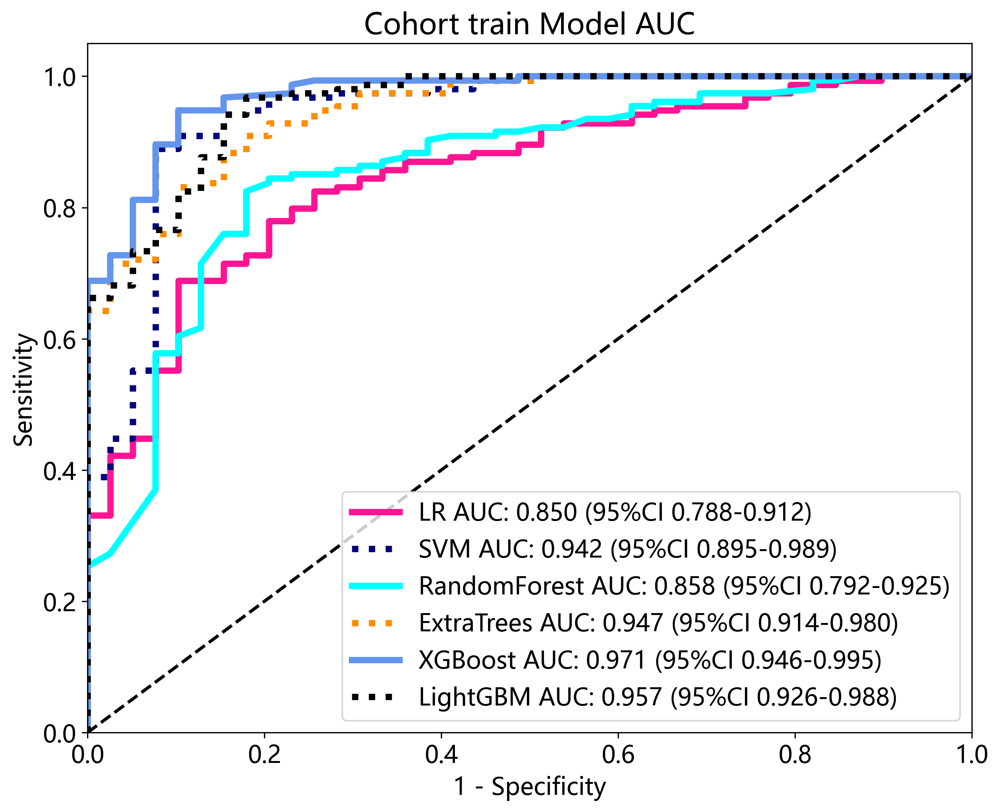

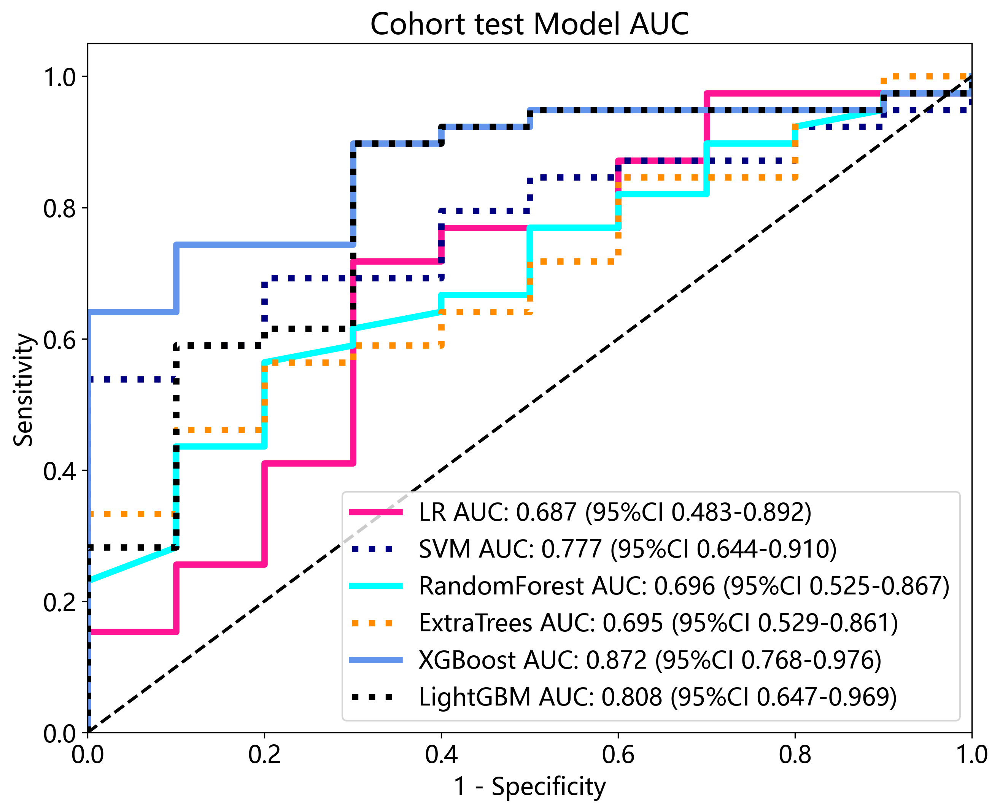

In [42]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_val_scores = []
    pred_test_scores = []
    
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_val_scores.append(pred_score[sel_model_idx][0])
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_val_scores), 
                          pred_val_scores, 
                          labels=sel_model, title=f"Cohort train Model AUC")
    plt.savefig(f'img/{task_type}Rad_model_train_roc.svg', bbox_inches = 'tight')
    plt.show()
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Cohort test Model AUC")
    plt.savefig(f'img/{task_type}Rad_model_test_roc.svg', bbox_inches = 'tight')

### DCA 决策曲线

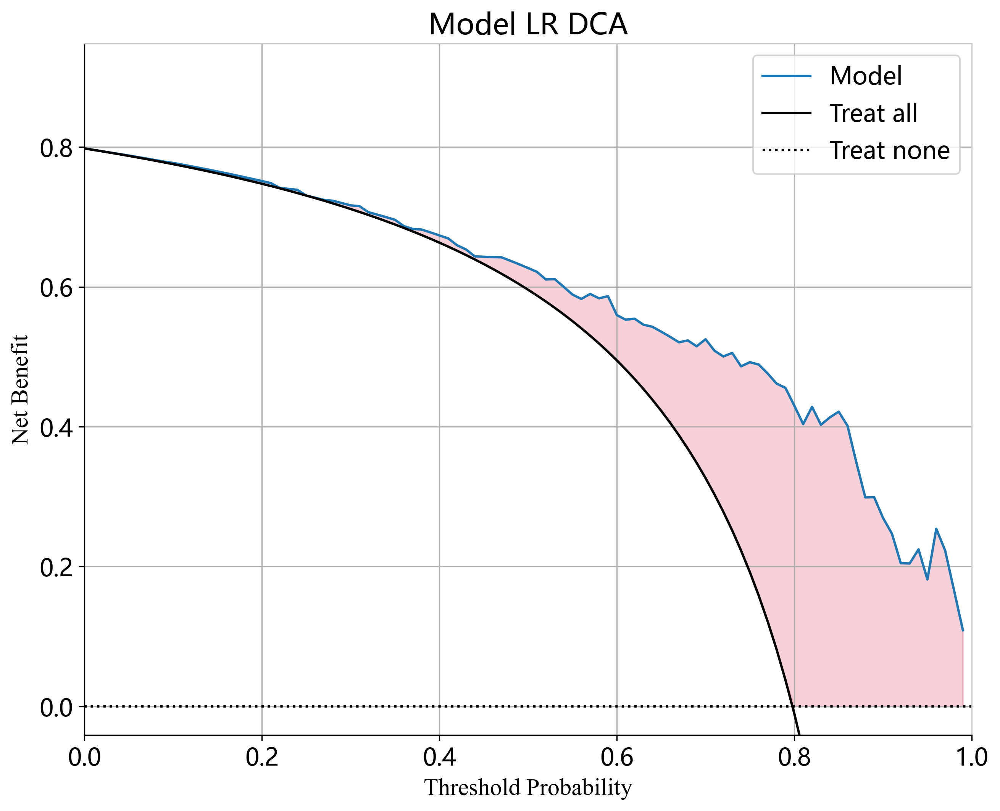

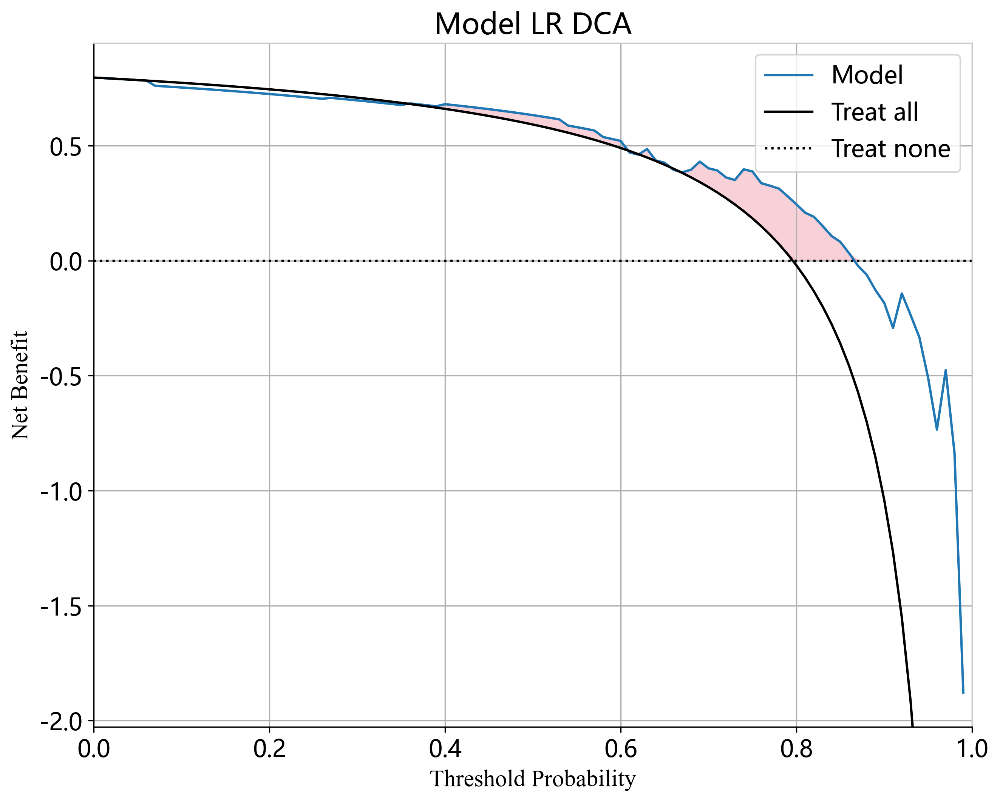

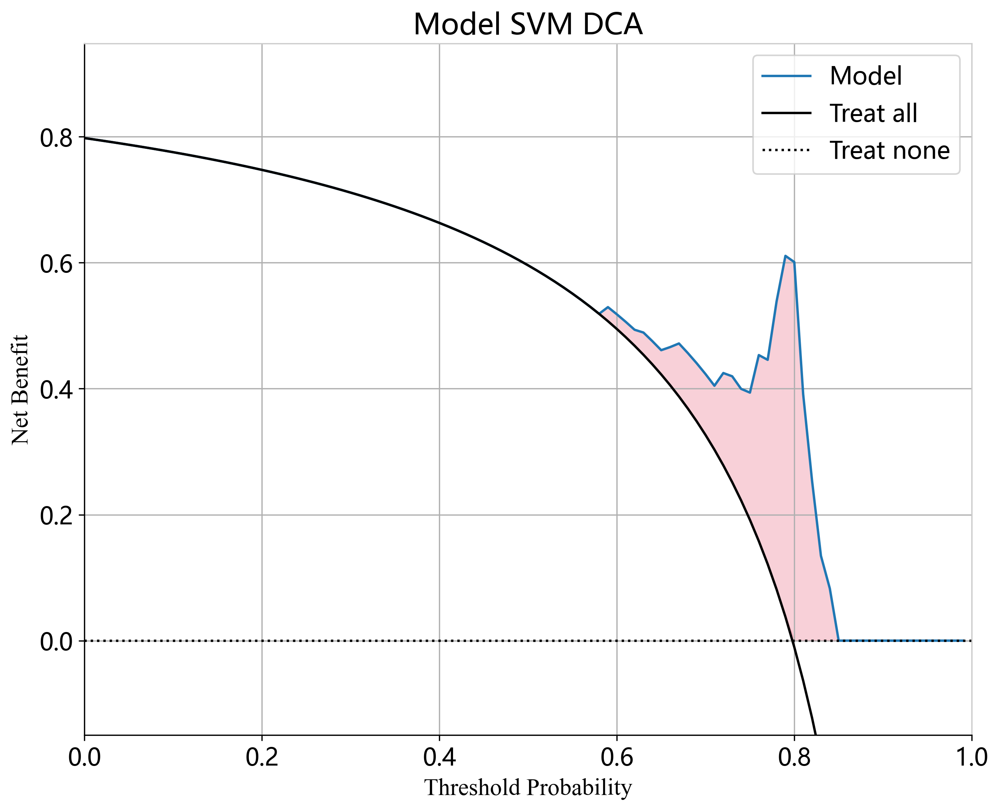

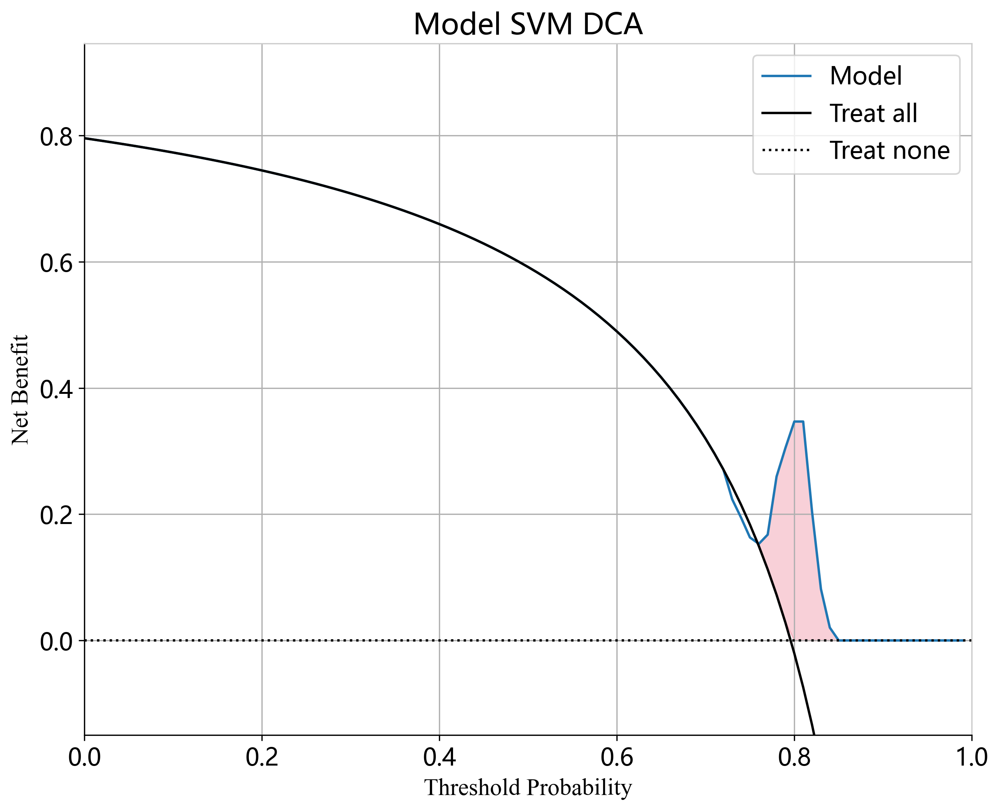

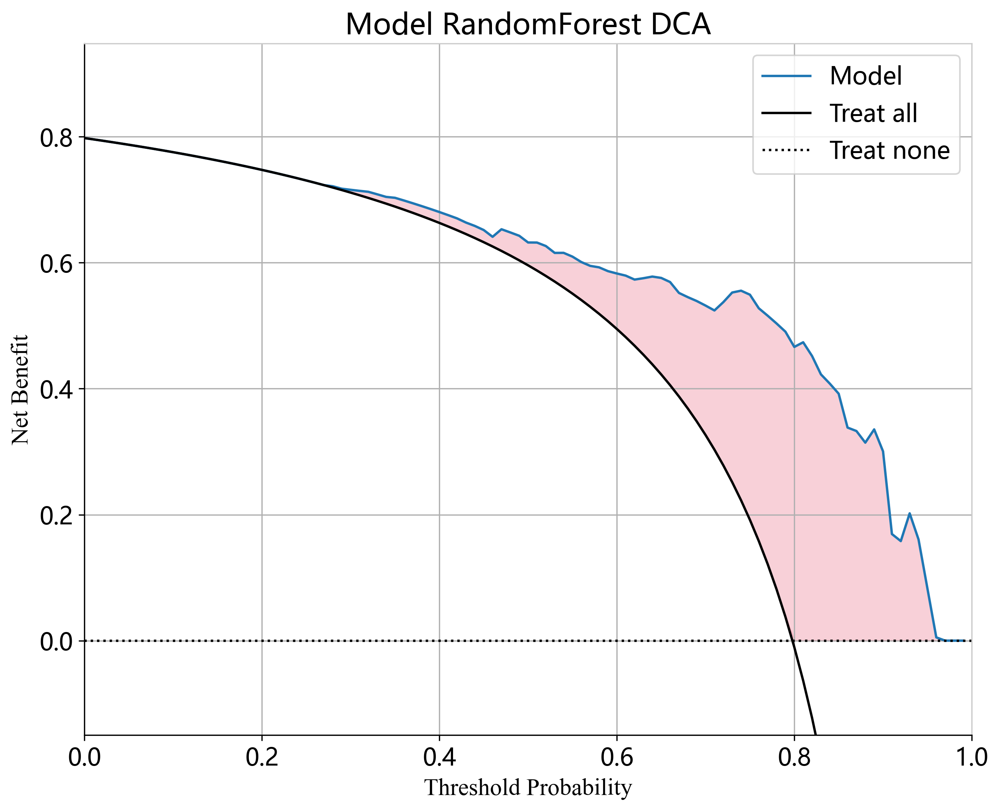

...

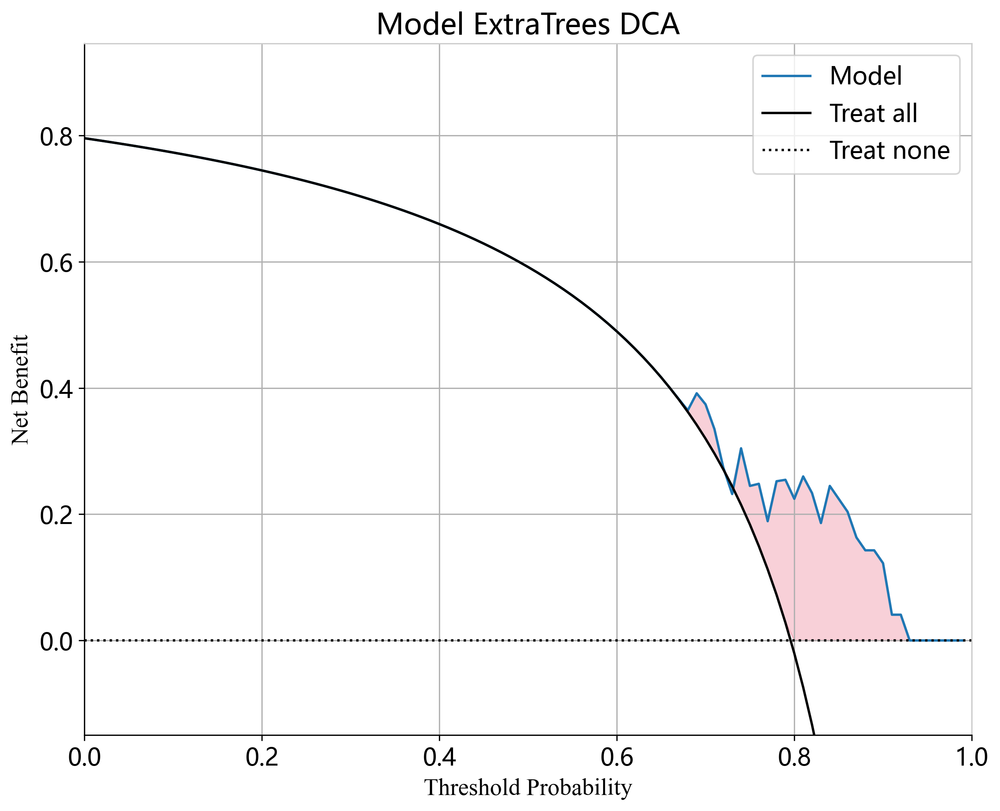

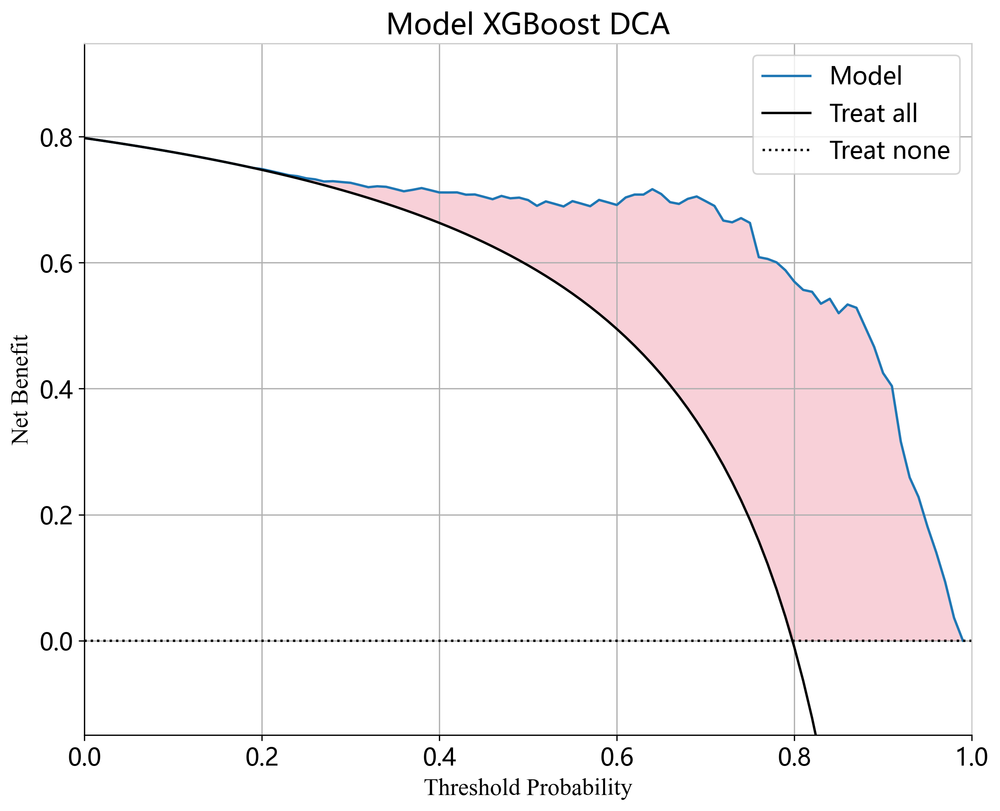

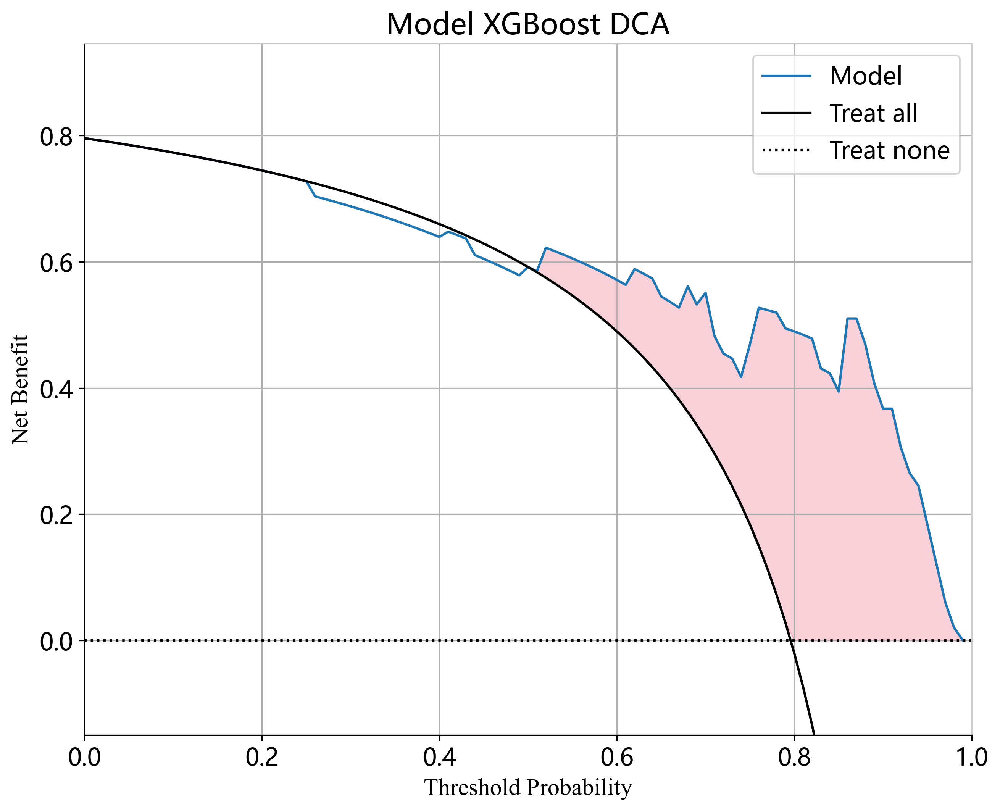

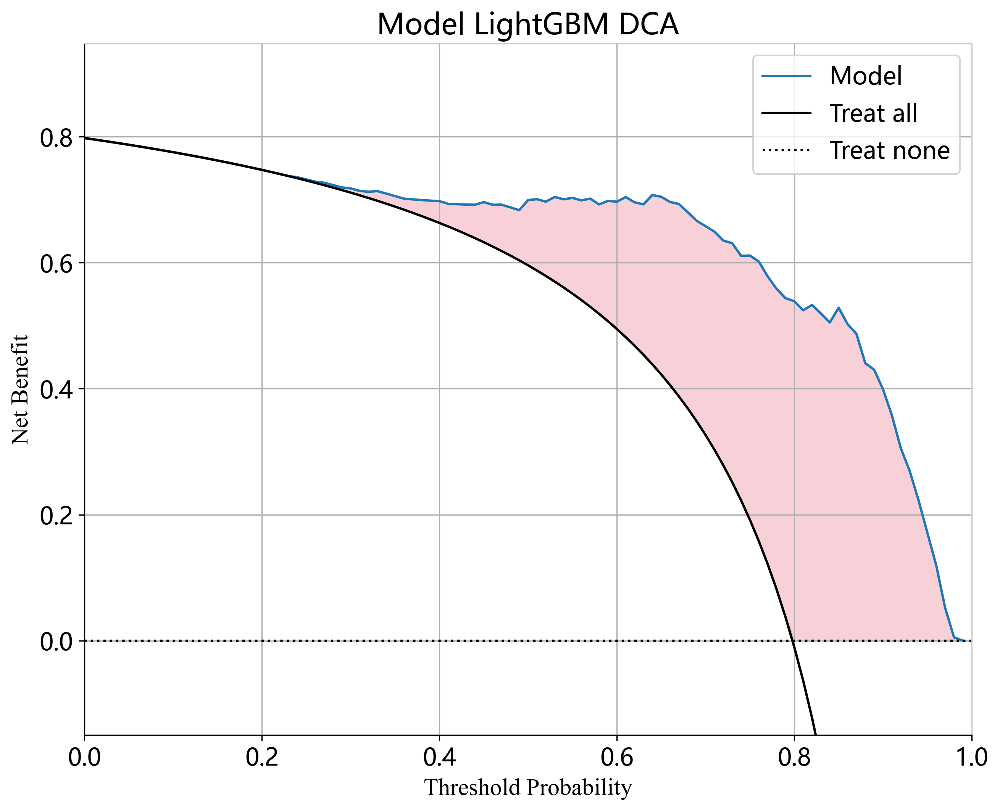

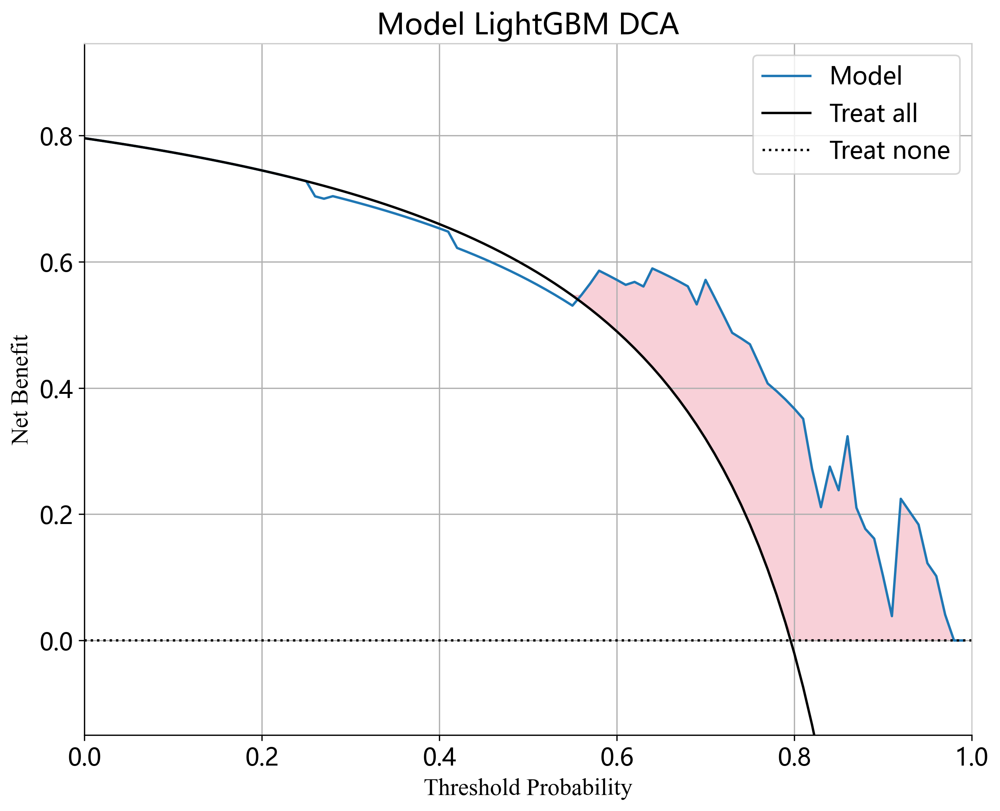

In [37]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}Rad_model_train_{sm}_dca.svg', bbox_inches = 'tight')
            plt.show()
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}Rad_model_test_{sm}_dca.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

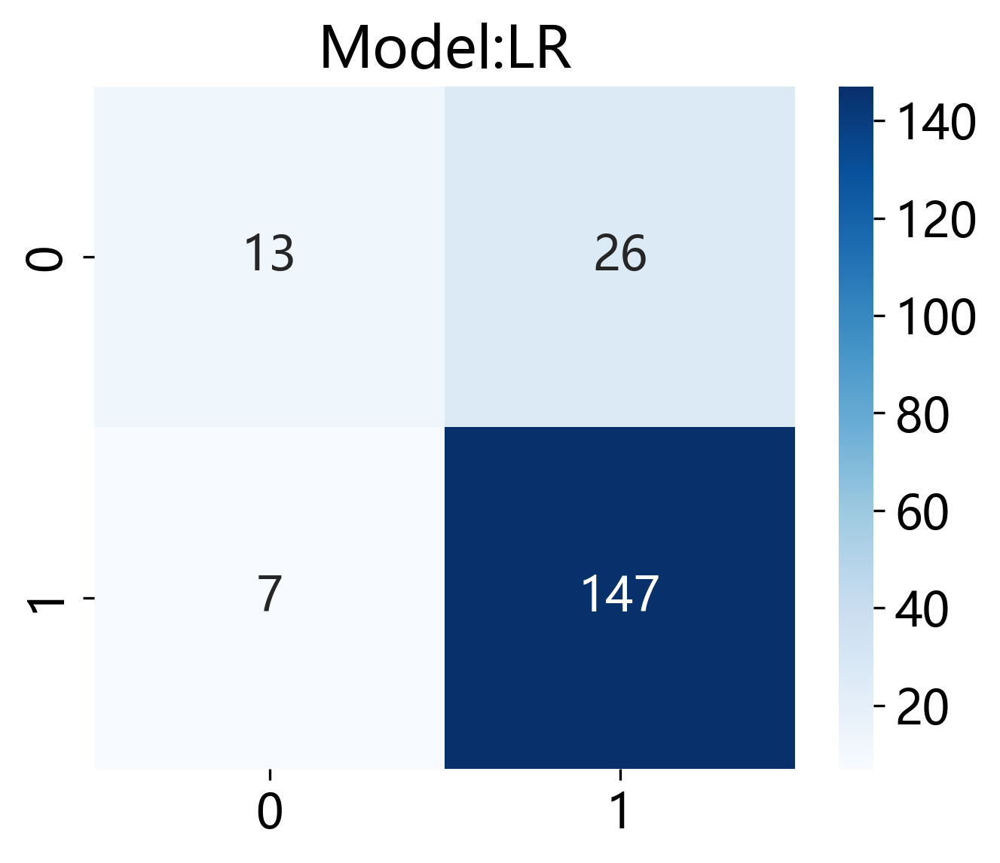

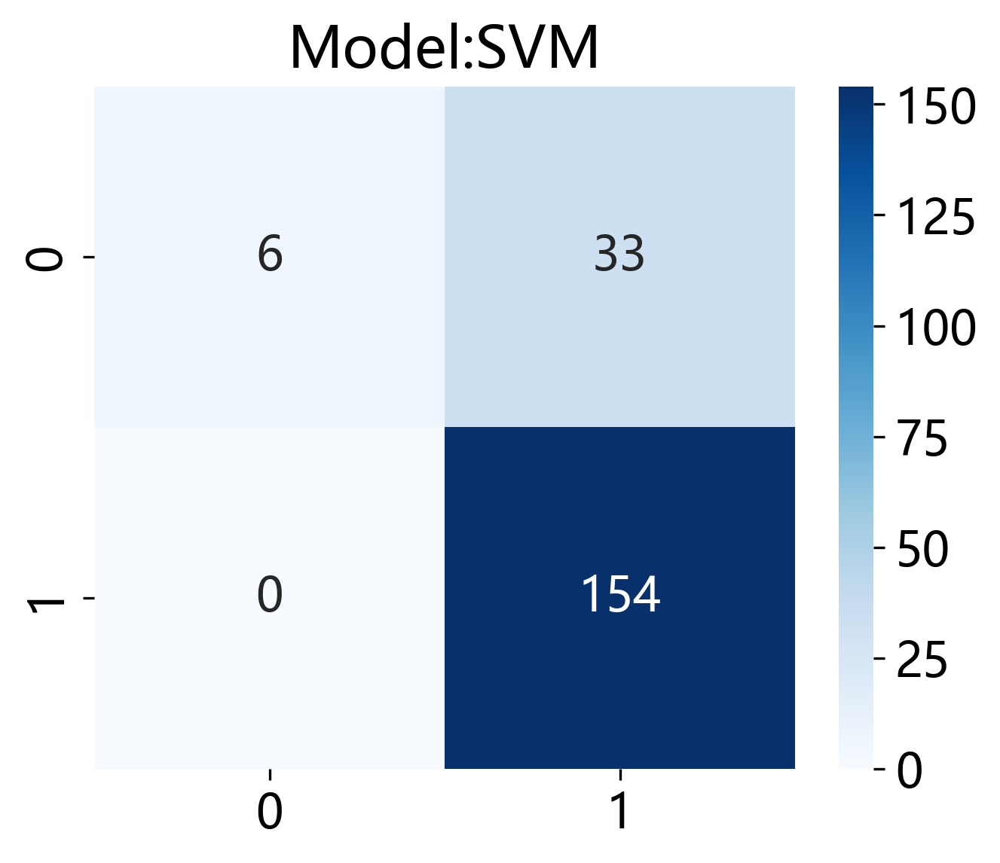

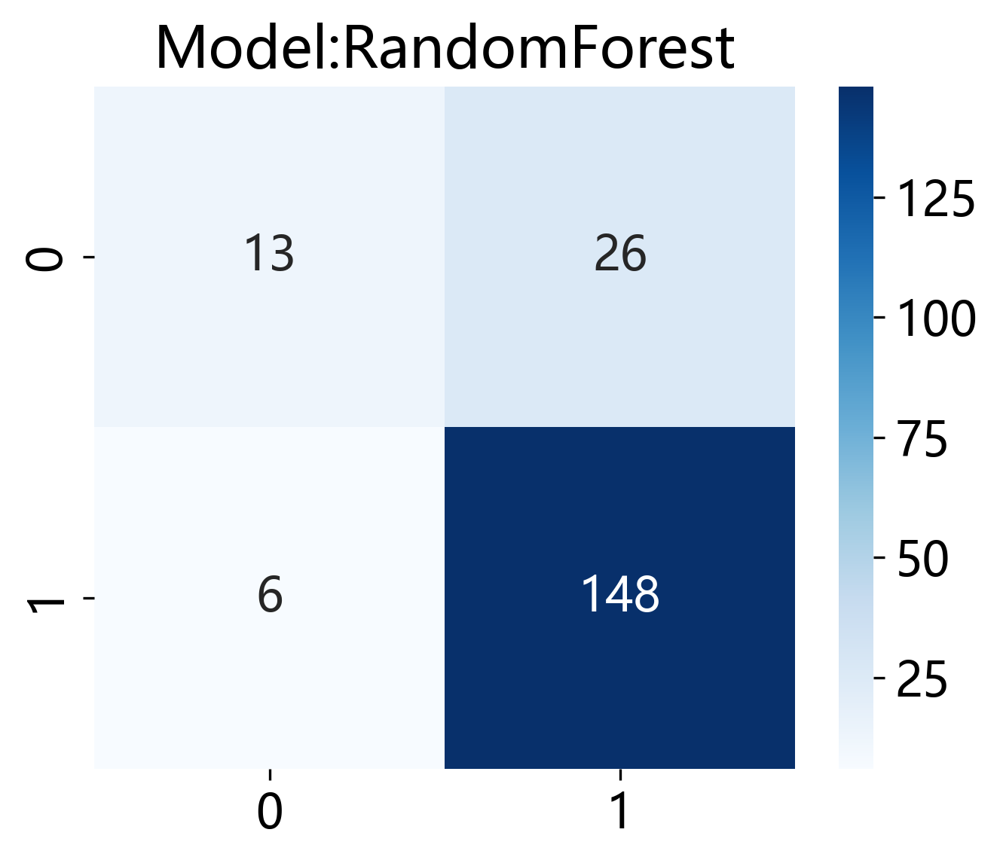

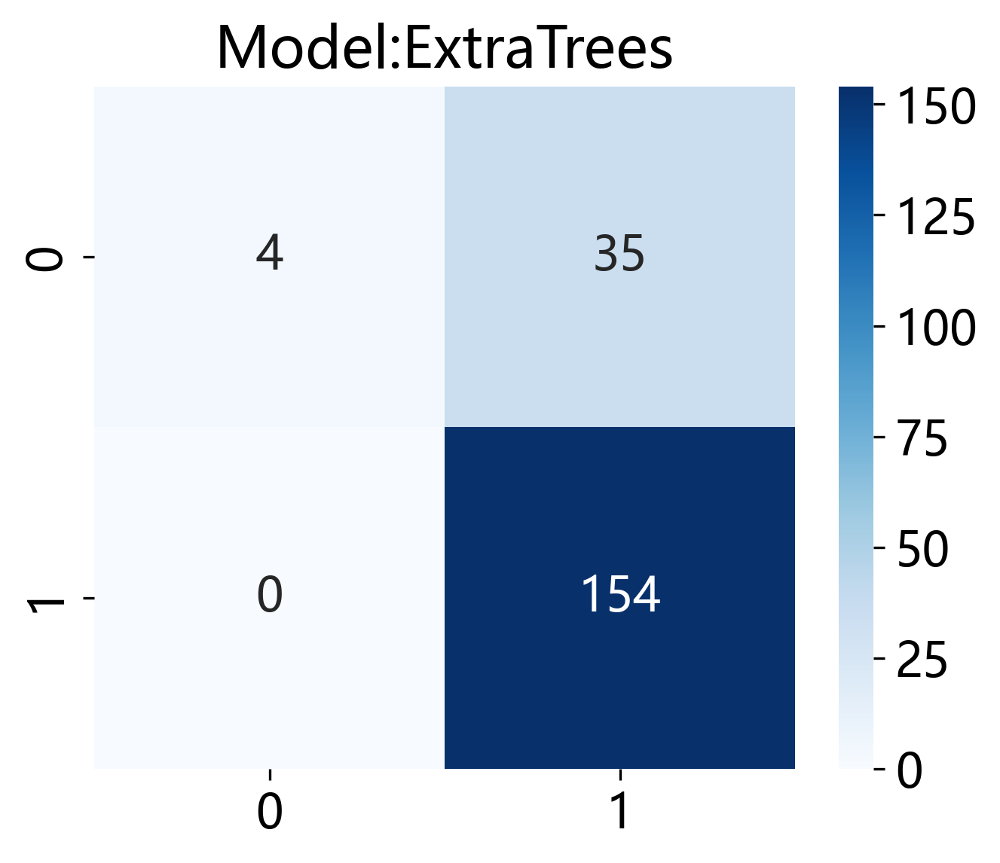

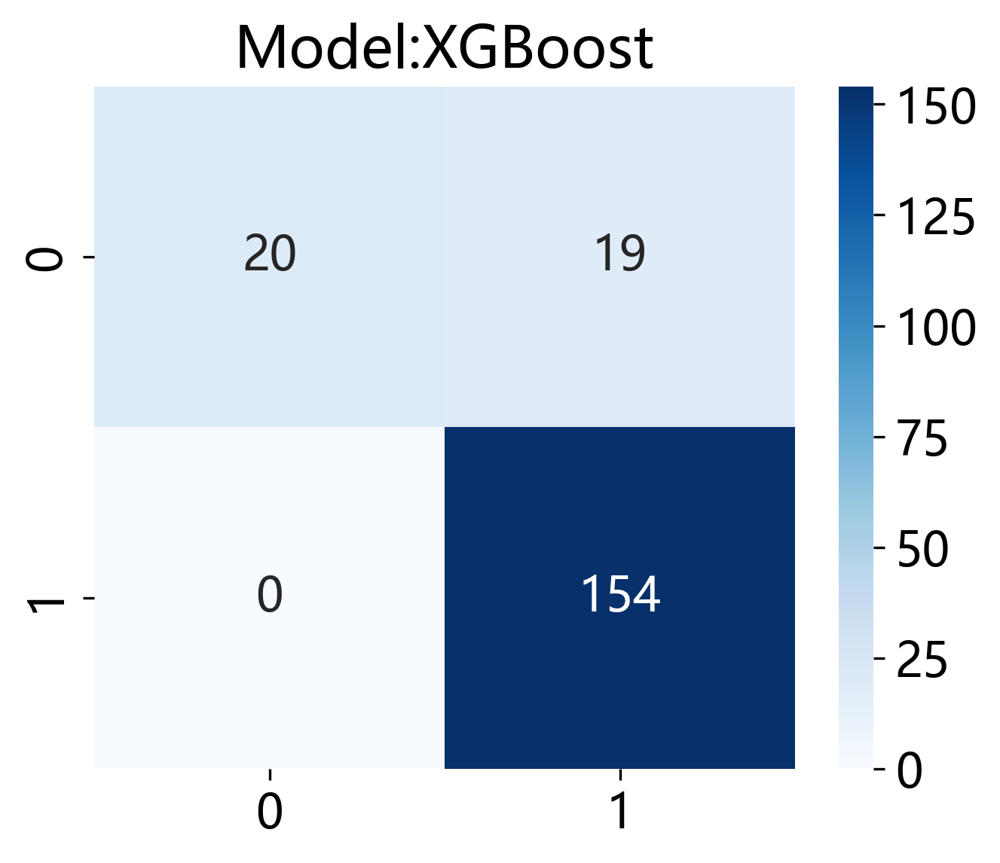

...

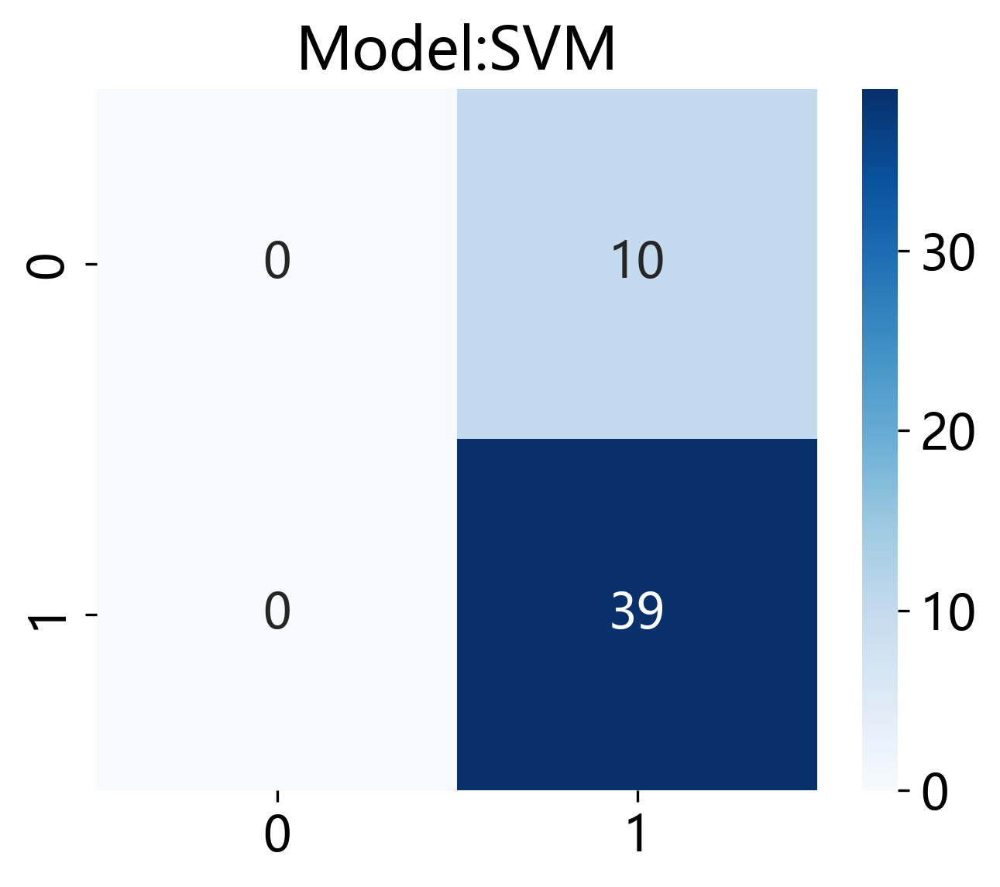

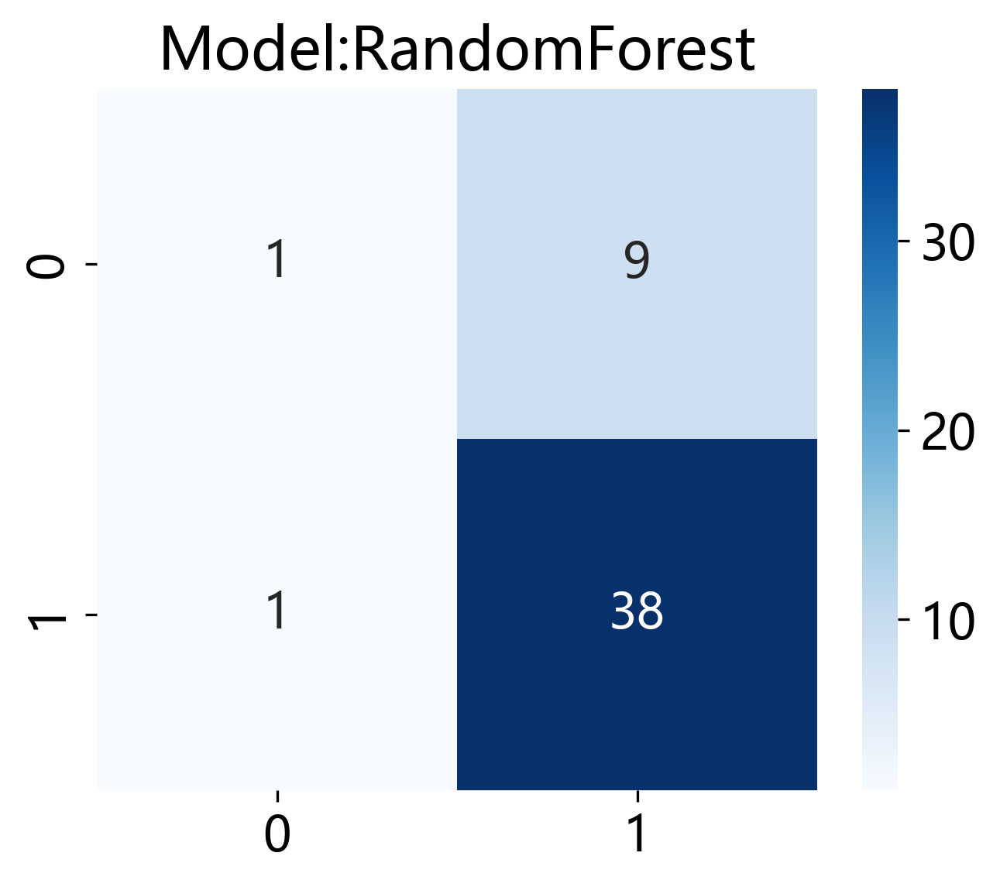

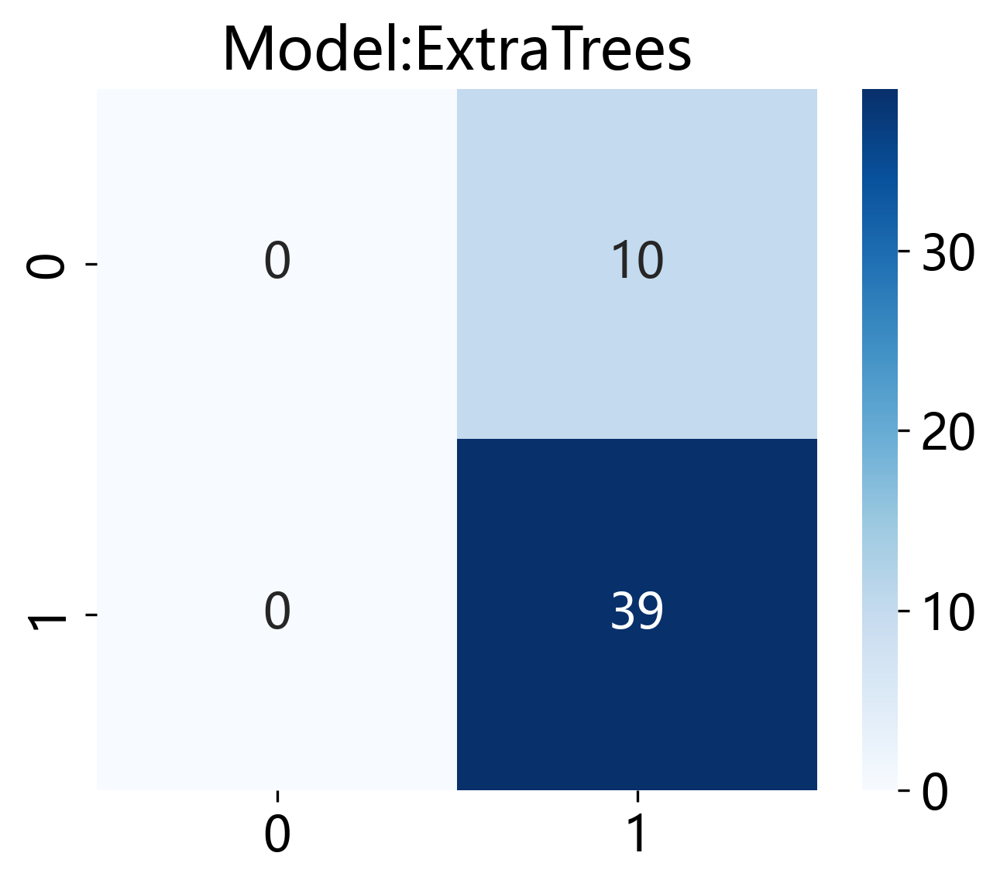

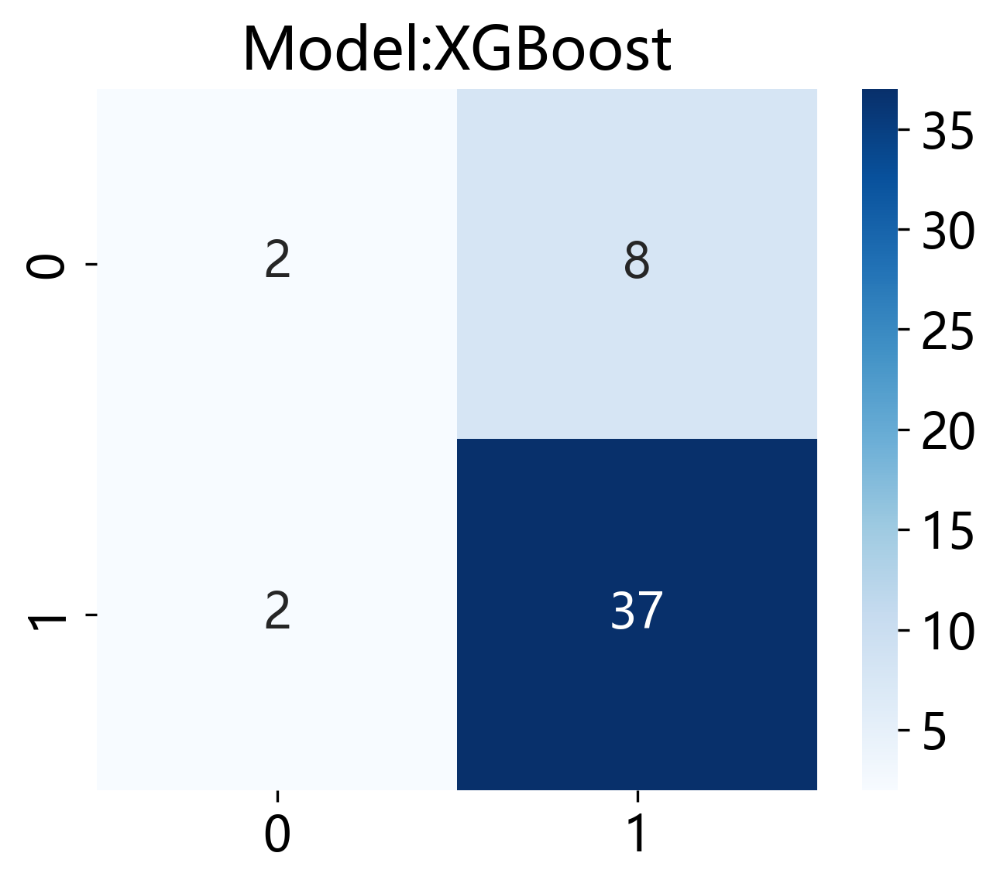

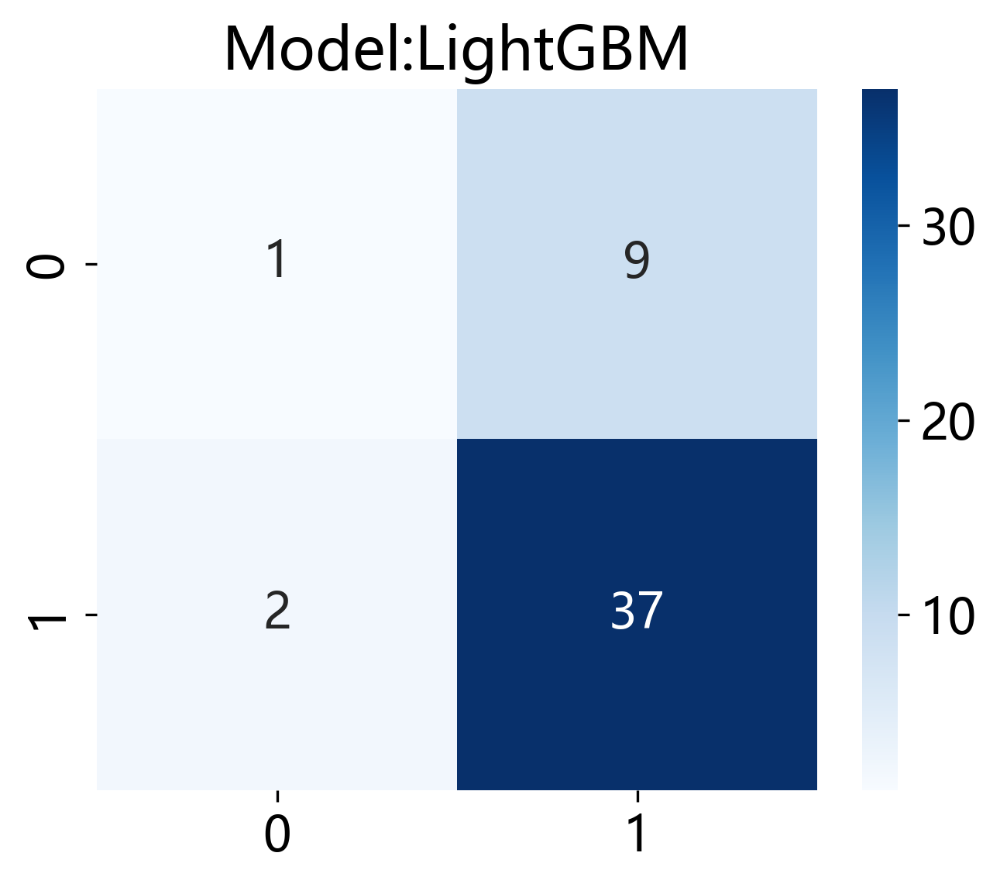

In [38]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.0f')
            plt.savefig(f'img/{task_type}Rad_model_train_{sm}_cm.svg', bbox_inches = 'tight')
            

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.0f')
            plt.savefig(f'img/{task_type}Rad_model_test_{sm}_cm.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

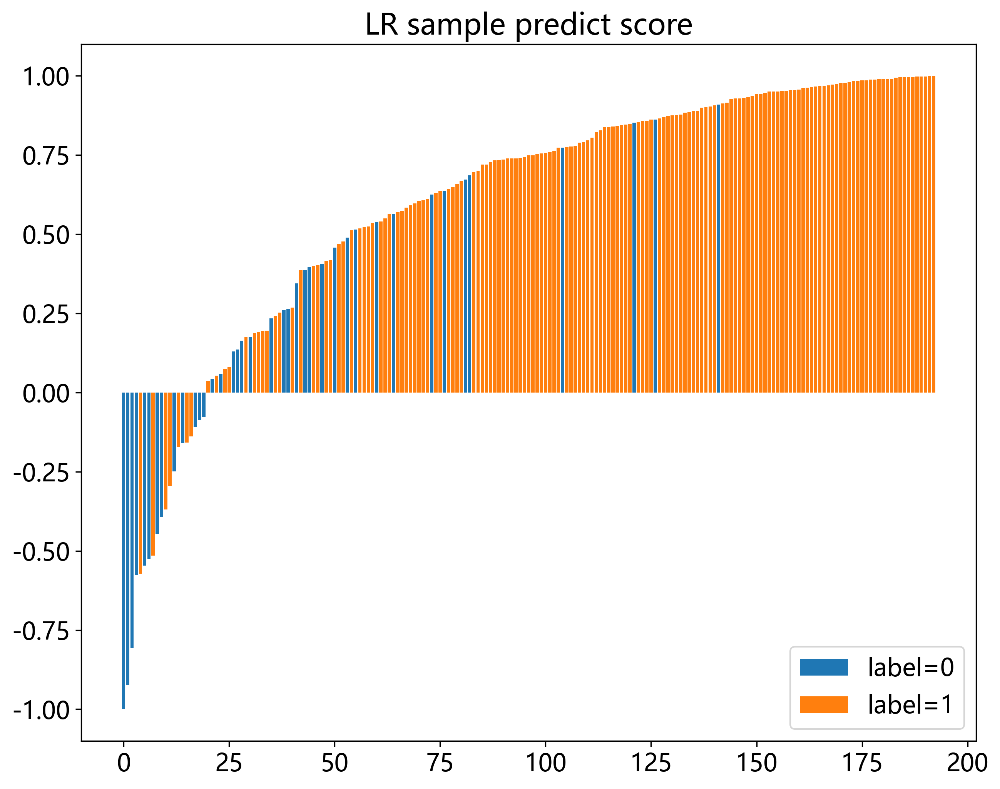

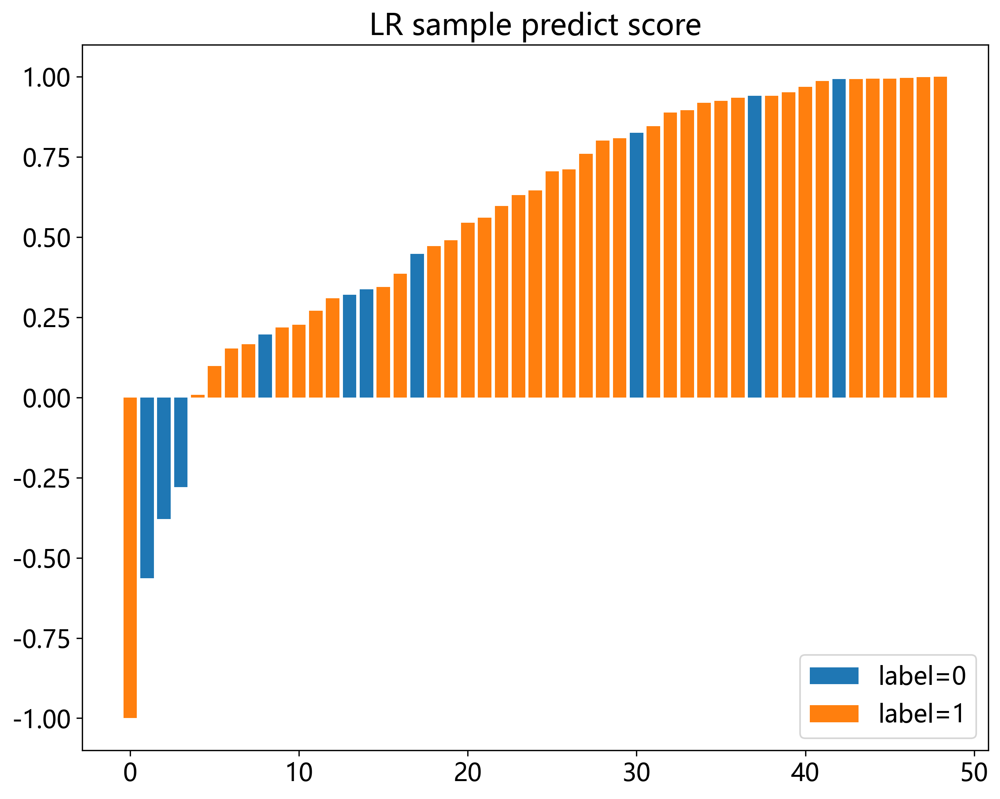

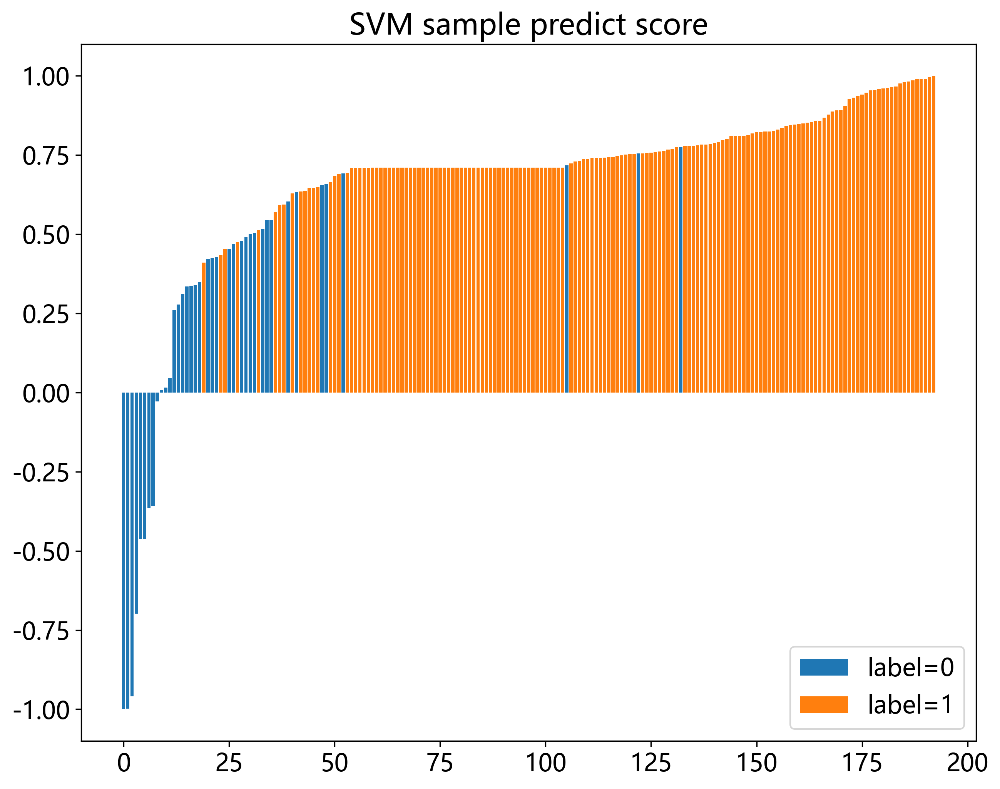

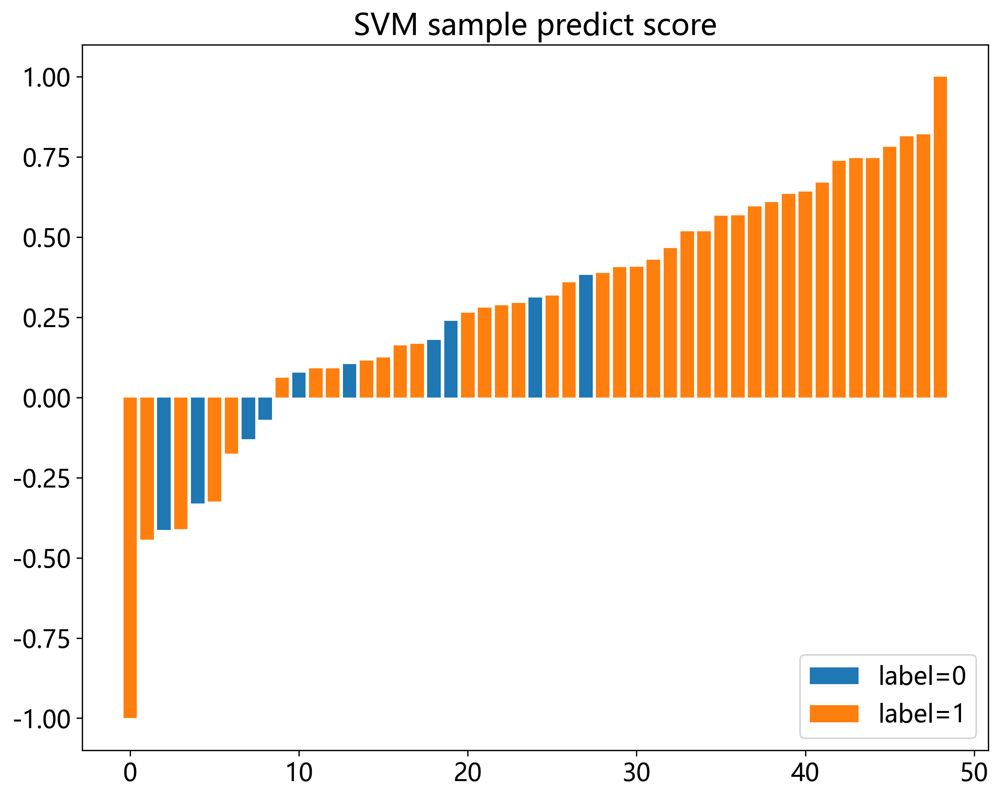

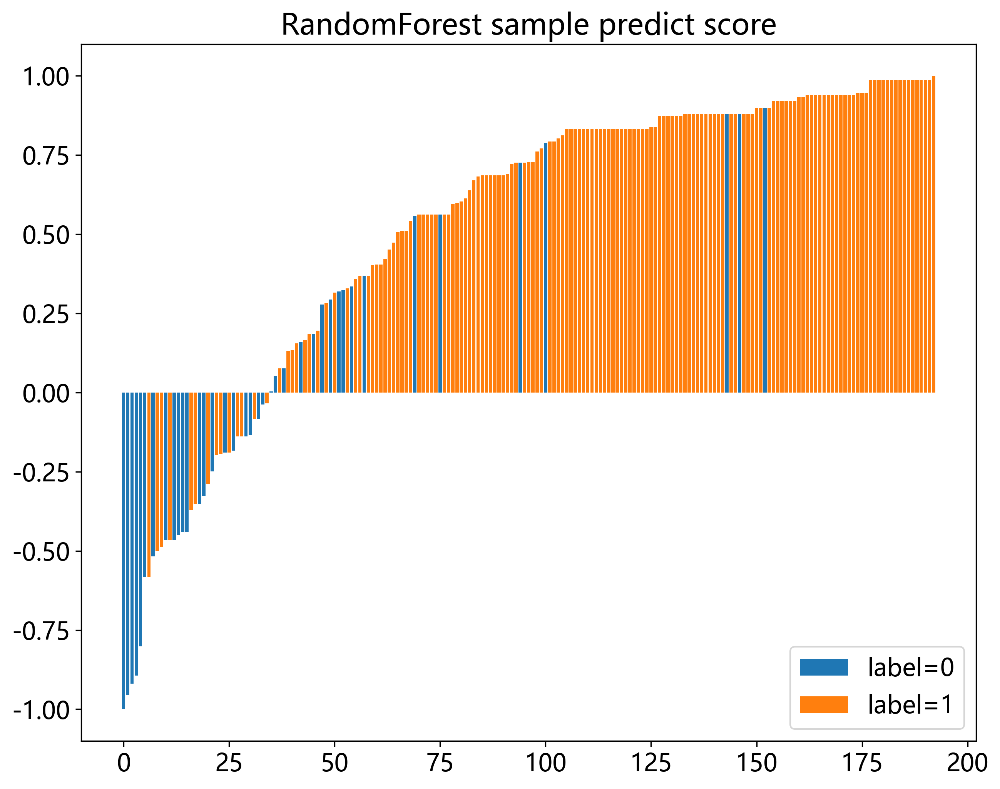

...

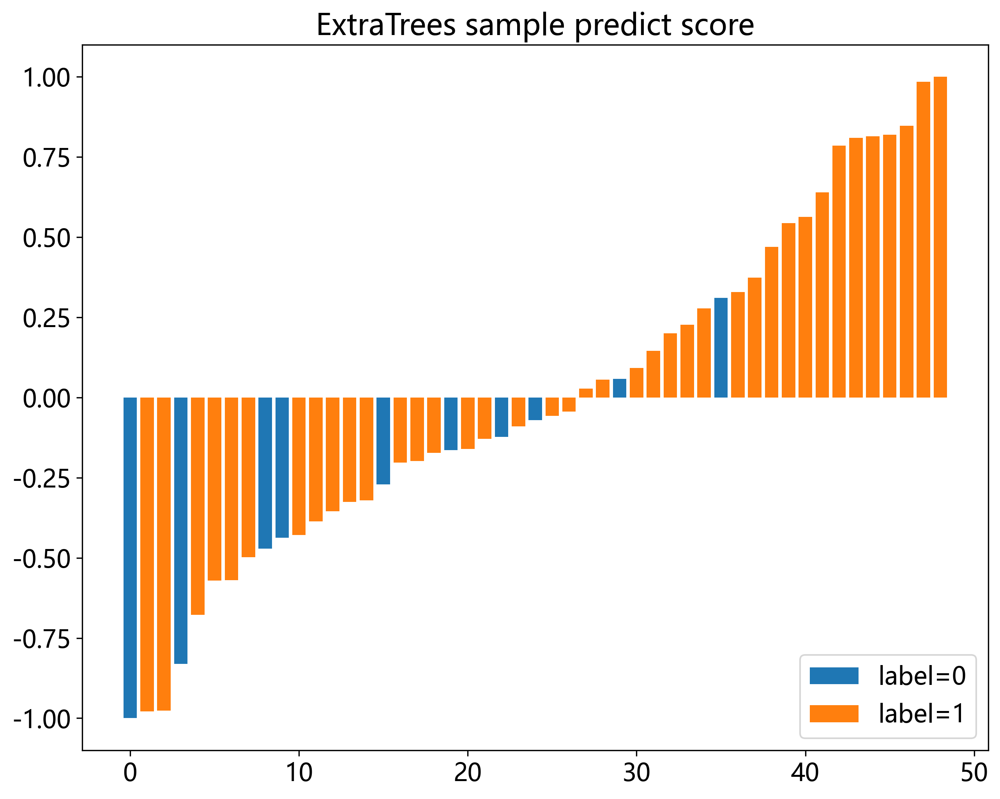

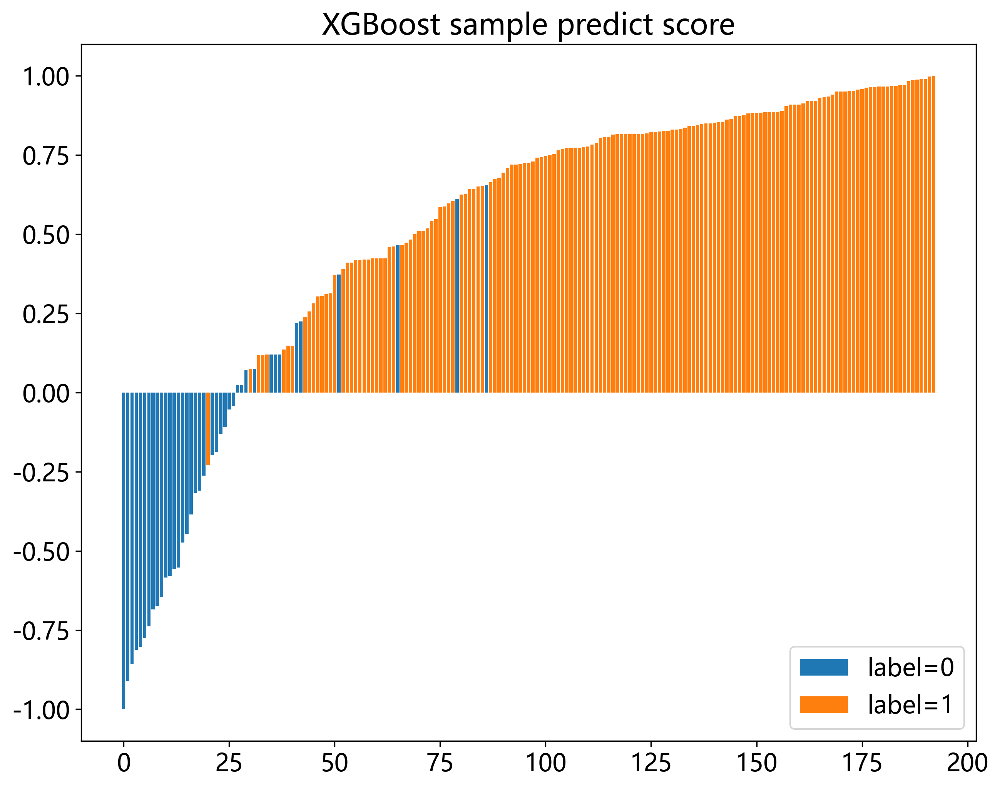

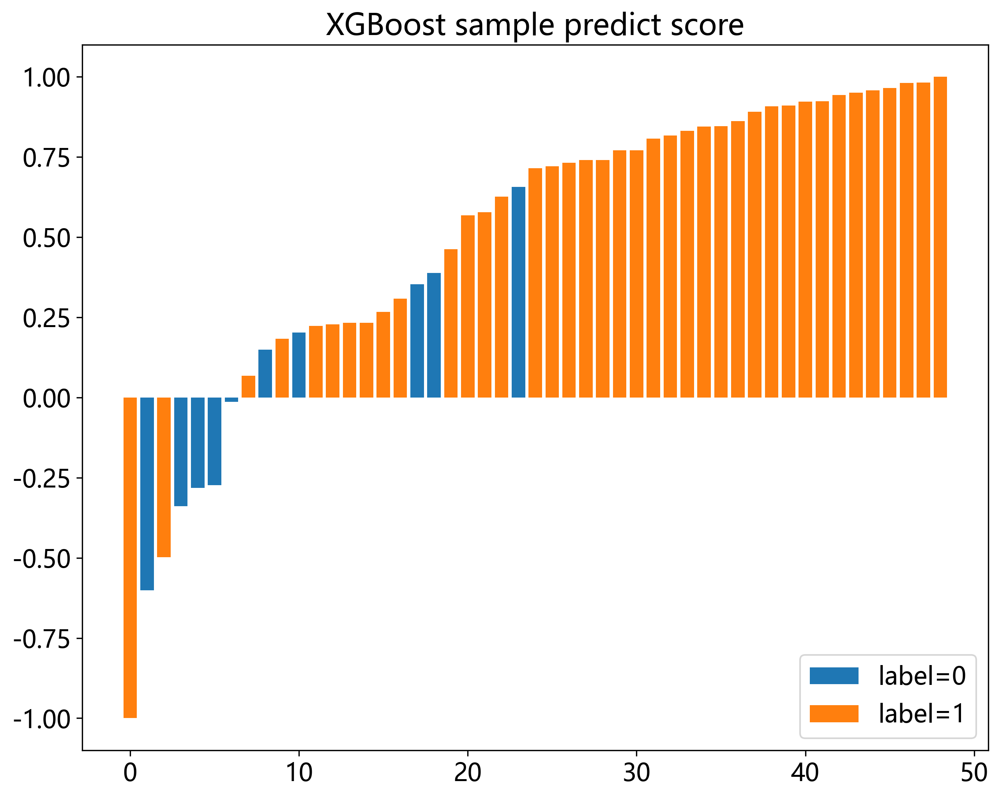

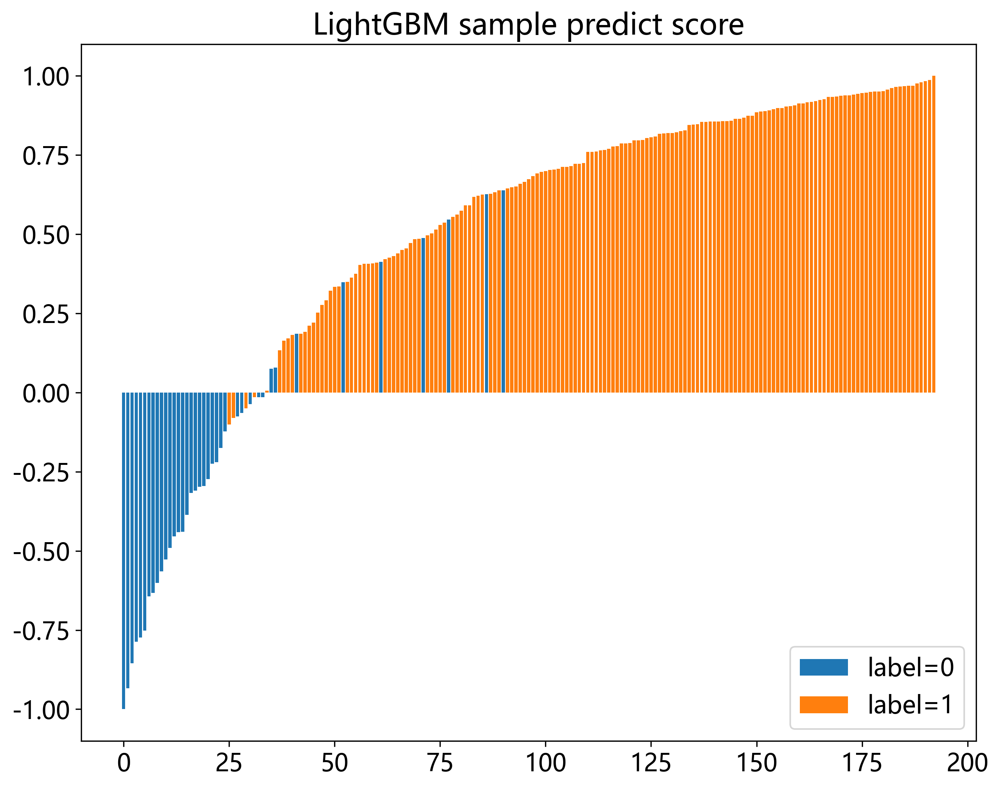

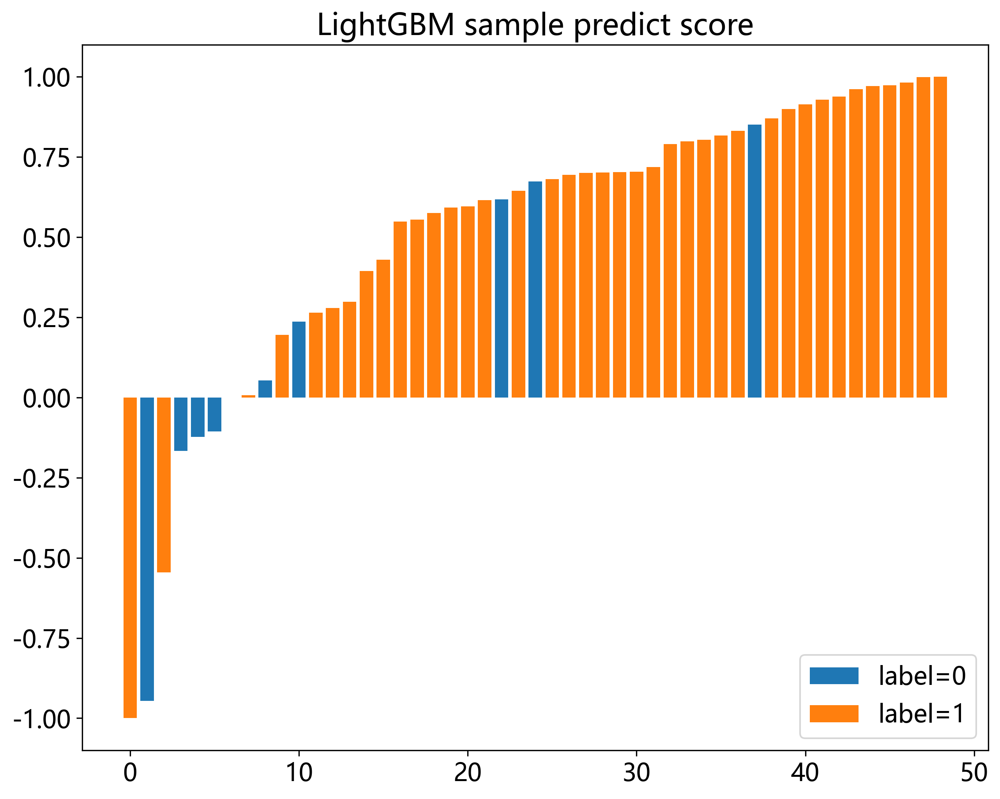

In [39]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0", "label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}Rad_train_{sm}_sample_dis.svg', bbox_inches = 'tight')
            plt.show()
  
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0", "label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}Rad_test_{sm}_sample_dis.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [40]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
#             val_indexes = np.reshape(np.array(val_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
#             y_val_pred_scores = target.predict_proba(X_val_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{task_type}Rad_{sm}_train.csv', index=False)
#             result_val = pd.DataFrame(np.concatenate([val_indexes, y_val_pred_scores], axis=1), columns=columns)
#             result_val.to_csv(f'results/{task_type}Rad_{sm}_val.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{task_type}Rad_{sm}_test.csv', index=False)

In [41]:
result_test['pred'] = result_test['label-1'].map(lambda x: 1 if float(x) > 0.5 else 0)
a = pd.merge(result_test, label_data, on='ID', how='inner')
a.sort_values(by='label-1')

,ID,label-0,label-1,pred,group,label
10,139.nii.gz,0.743758875128204,0.25624112487179596,0,test,1
5,113.nii.gz,0.7243346245498097,0.2756653754501904,0,test,0
36,4.nii.gz,0.5811375007998416,0.41886249920015833,0,test,1
22,209.nii.gz,0.44549947475320395,0.554500525246796,1,test,0
9,126.nii.gz,0.43001257626061473,0.5699874237393853,1,test,0
23,210.nii.gz,0.4238630027950907,0.5761369972049093,1,test,0
18,185.nii.gz,0.38627629399166297,0.613723706008337,1,test,0
3,111.nii.gz,0.38374287497059,0.61625712502941,1,test,1
44,79.nii.gz,0.3672398909955876,0.6327601090044124,1,test,0
15,168.nii.gz,0.3163280580742095,0.6836719419257905,1,test,1
